# MIRI PSF Photometry With Space_Phot

**Author**: Ori Fox<br>

**Submitted**: August, 2023<br>
**Updated**: November, 2023<br>

**Use case**: PSF Photometry on Level3 data using dedicated package Space_Phot (https://github.com/jpierel14/space_phot). Space_phot is built on Astropy's Photutils package. Unlike photutils, space_phot can be used on Level3 data. This is because has built in functionality that can generate a resampled Level3 PSF at a given detector position. Such use cases are particularly useful for faint, point source targets or deep upper limits where observers need to take advantage of the combined image stack. For a large number of bright sources, users may find space_phot to be too slow and should consider other packages, such as DOLPHOT and/or Photutils. **NOTE:** A companion notebook exists that illustrates how to use Photutils for the same Level2 data set.<br>
**Data**: MIRI Data PID 1028 (Calibration Program; Single Star Visit 006 A5V dwarf 2MASSJ17430448+6655015) and MIRI Data PID 1171 (LMC; Multiple Stars).<br>
**Tools**: photutils, space_phot drizzlepac, jupyter <br>
**Cross-Instrument**: NIRCam, MIRI.<br>
**Documentation**: This notebook is part of a STScI's larger post-pipeline Data Analysis Tools Ecosystem and can be downloaded directly from the JDAT Notebook Github directory.<br>
**Pipeline Version**: JWST Pipeline<br>


## Table of contents
1. [Introduction](#intro)<br>
    1.1 [Setup](#webbpsf)<br>
    1.2 [Python imports](#py_imports)<br>
2. [Download Data](#data)<br>
3. [Bright, Single Object](#bso)<br>
    3.1 [Multiple, Level2 Files](#bso2)<br>
    3.2 [Single, Level3 Mosaicked File](#bso3)<br>
4. [Faint/Upper Limit, Single Object](#fso)<br>
    4.1 [Multiple, Level2 Files](#fso2)<br>
    4.2 [Single, Level3 Mosaicked File](#fso3)<br>
5. [Stellar Field (LMC)](#lmv)<br>
    5.1 [Multiple, Level2 Files](#lmc2)<br>
    5.2 [Single, Level3 Mosaicked File](#lmc3)<br>

1.<font color='white'>-</font>Introduction <a class="anchor" id="intro"></a>
------------------

GOALS:<br>

PSF Photometry can be obtained using:<br>

* grid of PSF models from WebbPSF<br>
* single effective PSF (ePSF) NOT YET AVAILABLE<br>
* grid of effective PSF NOT YET AVAILABLE<br>

The notebook shows:<br>

* how to obtain the PSF model from WebbPSF (or build an ePSF)<br>
* how to perform PSF photometry on the image<br>

**Data**:<br>

MIRI Data PID 1028 (Calibration Program), F770W <br>
MIRI Data PID 1171 (LMC), F560W/F770W

In [1]:
%matplotlib inline

### 1.1<font color='white'>-</font>Setup WebbPSF and Synphot Directories<a class="anchor" id="webbpsf"></a> ###

In [2]:
%matplotlib inline

In [3]:
import sys,os,glob,shutil
import tarfile, urllib.request

# Set environmental variables
os.environ["WEBBPSF_PATH"] = "./webbpsf-data/webbpsf-data"
os.environ["PYSYN_CDBS"] = "./grp/redcat/trds/"

# WEBBPSF Data
boxlink = 'https://stsci.box.com/shared/static/qxpiaxsjwo15ml6m4pkhtk36c9jgj70k.gz'                                                           
boxfile = './webbpsf-data/webbpsf-data-1.0.0.tar.gz'
synphot_url = 'http://ssb.stsci.edu/trds/tarfiles/synphot5.tar.gz'
synphot_file = './synphot5.tar.gz'

webbpsf_folder = './webbpsf-data'
synphot_folder = './grp'

# Gather webbpsf files
psfExist = os.path.exists(webbpsf_folder)
if not psfExist:
    os.makedirs(webbpsf_folder)
    urllib.request.urlretrieve(boxlink, boxfile)
    gzf = tarfile.open(boxfile)
    gzf.extractall(webbpsf_folder)

# Gather synphot files
synExist = os.path.exists(synphot_folder)
if not synExist:
    os.makedirs(synphot_folder)
    urllib.request.urlretrieve(synphot_url, synphot_file)
    gzf = tarfile.open(synphot_file)
    gzf.extractall('./')

### 1.2<font color='white'>-</font>Python Imports<a class="anchor" id="py_imports"></a> ###

In [4]:
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
import numpy as np
import matplotlib.pyplot as plt
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from mpl_toolkits.axes_grid1 import make_axes_locatable
import time
import math
from importlib.metadata import version

import space_phot

# JWST models
#
from jwst import datamodels, associations
from jwst.datamodels import ImageModel, dqflags

# Background and PSF Functions
#
from photutils.background import MMMBackground, MADStdBackgroundRMS, Background2D
from photutils.detection import DAOStarFinder
from photutils import EPSFBuilder, GriddedPSFModel
from photutils.psf import DAOGroup, extract_stars, IterativelySubtractedPSFPhotometry

# Photutils library and tools
#
import photutils
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry
from photutils import Background2D, MedianBackground, ModeEstimatorBackground, MMMBackground



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    


**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-062 CANNOT BE CHECKED AGAINST ONLINE VERSION


The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol


In [5]:
!pip install space_phot --upgrade

In [6]:
# Space_Phot Version Number for Reference 
from importlib.metadata import version
version('space_phot')

'0.1.6'

In [7]:
version('poppy')

'1.0.3'

In [8]:
version('jwst')

'1.12.5'

2.<font color='white'>-</font>Download Data<a class="anchor" id="data"></a>
------------------

In [9]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1028 and a specific filter 'F770W'

obs = Observations.query_criteria(proposal_id=1028, filters=['F770W'])

# Locate a specific observation by its unique observation ID 'jw01537-o024_t001_nircam_clear-f444w-sub160'
#row = obs[obs['obs_id']=='jw01028-o006_t001_miri_f770w']

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])

# Download the selected products from the MAST database (UNCOMMENT TO DOWNLOAD)
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01028/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01028*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)


2023-12-15 16:48:14,489 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028-o006_t001_miri_f770w/jw01028-o006_20231022t050813_image3_00004_asn.json with expected size 2891.
2023-12-15 16:48:14,617 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028-o006_t001_miri_f770w/jw01028-o006_t001_miri_f770w_i2d.fits with expected size 30240000.


INFO: Found cached file ./mastDownload/JWST/jw01028-o006_t001_miri_f770w/jw01028-o006_20231022t050813_image3_00004_asn.json with expected size 2891. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028-o006_t001_miri_f770w/jw01028-o006_t001_miri_f770w_i2d.fits with expected size 30240000. [astroquery.query]


2023-12-15 16:48:14,746 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028-o006_20231022t050813_image2_00016_asn.json with expected size 1816.
2023-12-15 16:48:14,899 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028006001_02101_00001_mirimage_cal.fits with expected size 29687040.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028-o006_20231022t050813_image2_00016_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028006001_02101_00001_mirimage_cal.fits with expected size 29687040. [astroquery.query]


2023-12-15 16:48:15,043 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028006001_02101_00001_mirimage_i2d.fits with expected size 29445120.
2023-12-15 16:48:15,171 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028-o006_20231022t050813_image2_00015_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00001_mirimage/jw01028006001_02101_00001_mirimage_i2d.fits with expected size 29445120. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028-o006_20231022t050813_image2_00015_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:15,330 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028006001_02101_00002_mirimage_cal.fits with expected size 29687040.
2023-12-15 16:48:15,470 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028006001_02101_00002_mirimage_i2d.fits with expected size 29445120.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028006001_02101_00002_mirimage_cal.fits with expected size 29687040. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00002_mirimage/jw01028006001_02101_00002_mirimage_i2d.fits with expected size 29445120. [astroquery.query]


2023-12-15 16:48:15,603 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028-o006_20231022t050813_image2_00014_asn.json with expected size 1816.
2023-12-15 16:48:15,744 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028006001_02101_00003_mirimage_cal.fits with expected size 29687040.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028-o006_20231022t050813_image2_00014_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028006001_02101_00003_mirimage_cal.fits with expected size 29687040. [astroquery.query]


2023-12-15 16:48:15,884 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028006001_02101_00003_mirimage_i2d.fits with expected size 29445120.
2023-12-15 16:48:16,015 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028-o006_20231022t050813_image2_00013_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00003_mirimage/jw01028006001_02101_00003_mirimage_i2d.fits with expected size 29445120. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028-o006_20231022t050813_image2_00013_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:16,145 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028006001_02101_00004_mirimage_cal.fits with expected size 29687040.
2023-12-15 16:48:16,278 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028006001_02101_00004_mirimage_i2d.fits with expected size 29445120.


INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028006001_02101_00004_mirimage_cal.fits with expected size 29687040. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01028006001_02101_00004_mirimage/jw01028006001_02101_00004_mirimage_i2d.fits with expected size 29445120. [astroquery.query]


In [10]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1171 and a specific filters 'F550W' and 'F770W'

obs = Observations.query_criteria(proposal_id=1171, filters=['F560W','F770W'])

# Locate a specific observation by its unique observation ID 'jw01537-o024_t001_nircam_clear-f444w-sub160'
#row = obs[obs['obs_id']=='jw01028-o006_t001_miri_f770w']

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])
fplist

# Download the selected products from the MAST database (UNCOMMENT TO DOWNLOAD)
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01171/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01171*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)

2023-12-15 16:48:16,975 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o001_t001_miri_f770w/jw01171-o001_20231102t191130_image3_00002_asn.json with expected size 2811.
2023-12-15 16:48:17,102 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o001_t001_miri_f770w/jw01171-o001_t001_miri_f770w_i2d.fits with expected size 30481920.


INFO: Found cached file ./mastDownload/JWST/jw01171-o001_t001_miri_f770w/jw01171-o001_20231102t191130_image3_00002_asn.json with expected size 2811. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171-o001_t001_miri_f770w/jw01171-o001_t001_miri_f770w_i2d.fits with expected size 30481920. [astroquery.query]


2023-12-15 16:48:17,253 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o002_t001_miri_f770w/jw01171-o002_20231102t191130_image3_00002_asn.json with expected size 2811.
2023-12-15 16:48:17,382 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o002_t001_miri_f770w/jw01171-o002_t001_miri_f770w_i2d.fits with expected size 29655360.


INFO: Found cached file ./mastDownload/JWST/jw01171-o002_t001_miri_f770w/jw01171-o002_20231102t191130_image3_00002_asn.json with expected size 2811. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171-o002_t001_miri_f770w/jw01171-o002_t001_miri_f770w_i2d.fits with expected size 29655360. [astroquery.query]


2023-12-15 16:48:17,520 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o003_t001_miri_f770w/jw01171-o003_20231102t191130_image3_00002_asn.json with expected size 2811.
2023-12-15 16:48:17,676 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o003_t001_miri_f770w/jw01171-o003_t001_miri_f770w_i2d.fits with expected size 31590720.


INFO: Found cached file ./mastDownload/JWST/jw01171-o003_t001_miri_f770w/jw01171-o003_20231102t191130_image3_00002_asn.json with expected size 2811. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171-o003_t001_miri_f770w/jw01171-o003_t001_miri_f770w_i2d.fits with expected size 31590720. [astroquery.query]


2023-12-15 16:48:17,875 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o004_t001_miri_f560w/jw01171-o004_20231102t191130_image3_00002_asn.json with expected size 2811.
2023-12-15 16:48:18,053 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o004_t001_miri_f560w/jw01171-o004_t001_miri_f560w_i2d.fits with expected size 32195520.


INFO: Found cached file ./mastDownload/JWST/jw01171-o004_t001_miri_f560w/jw01171-o004_20231102t191130_image3_00002_asn.json with expected size 2811. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171-o004_t001_miri_f560w/jw01171-o004_t001_miri_f560w_i2d.fits with expected size 32195520. [astroquery.query]


2023-12-15 16:48:18,215 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o005_t001_miri_f770w/jw01171-o005_20231102t191130_image3_00002_asn.json with expected size 2811.
2023-12-15 16:48:18,351 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171-o005_t001_miri_f770w/jw01171-o005_t001_miri_f770w_i2d.fits with expected size 30481920.


INFO: Found cached file ./mastDownload/JWST/jw01171-o005_t001_miri_f770w/jw01171-o005_20231102t191130_image3_00002_asn.json with expected size 2811. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171-o005_t001_miri_f770w/jw01171-o005_t001_miri_f770w_i2d.fits with expected size 30481920. [astroquery.query]


2023-12-15 16:48:18,500 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171-o001_20231102t191130_image2_00008_asn.json with expected size 1816.
2023-12-15 16:48:18,646 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171001001_02101_00001_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171-o001_20231102t191130_image2_00008_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171001001_02101_00001_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:18,809 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171001001_02101_00001_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:18,958 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171-o001_20231102t191130_image2_00007_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00001_mirimage/jw01171001001_02101_00001_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171-o001_20231102t191130_image2_00007_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:19,094 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171001001_02101_00002_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:19,239 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171001001_02101_00002_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171001001_02101_00002_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00002_mirimage/jw01171001001_02101_00002_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:19,387 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171-o001_20231102t191130_image2_00006_asn.json with expected size 1816.
2023-12-15 16:48:19,532 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171001001_02101_00003_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171-o001_20231102t191130_image2_00006_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171001001_02101_00003_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:19,679 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171001001_02101_00003_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:19,833 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171-o001_20231102t191130_image2_00005_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00003_mirimage/jw01171001001_02101_00003_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171-o001_20231102t191130_image2_00005_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:19,973 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171001001_02101_00004_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:20,135 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171001001_02101_00004_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171001001_02101_00004_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171001001_02101_00004_mirimage/jw01171001001_02101_00004_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:20,280 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171-o002_20231102t191130_image2_00008_asn.json with expected size 1816.
2023-12-15 16:48:20,413 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171002001_02101_00001_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171-o002_20231102t191130_image2_00008_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171002001_02101_00001_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:20,552 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171002001_02101_00001_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:20,690 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171-o002_20231102t191130_image2_00007_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00001_mirimage/jw01171002001_02101_00001_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171-o002_20231102t191130_image2_00007_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:20,841 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171002001_02101_00002_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:20,986 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171002001_02101_00002_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171002001_02101_00002_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00002_mirimage/jw01171002001_02101_00002_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:21,122 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171-o002_20231102t191130_image2_00006_asn.json with expected size 1816.
2023-12-15 16:48:21,265 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171002001_02101_00003_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171-o002_20231102t191130_image2_00006_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171002001_02101_00003_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:21,401 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171002001_02101_00003_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:21,539 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171-o002_20231102t191130_image2_00005_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00003_mirimage/jw01171002001_02101_00003_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171-o002_20231102t191130_image2_00005_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:21,679 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171002001_02101_00004_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:21,819 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171002001_02101_00004_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171002001_02101_00004_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171002001_02101_00004_mirimage/jw01171002001_02101_00004_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:21,959 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171-o003_20231102t191130_image2_00008_asn.json with expected size 1816.
2023-12-15 16:48:22,090 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171003001_02101_00001_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171-o003_20231102t191130_image2_00008_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171003001_02101_00001_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:22,244 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171003001_02101_00001_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:22,396 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171-o003_20231102t191130_image2_00007_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00001_mirimage/jw01171003001_02101_00001_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171-o003_20231102t191130_image2_00007_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:22,530 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171003001_02101_00002_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:22,670 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171003001_02101_00002_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171003001_02101_00002_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00002_mirimage/jw01171003001_02101_00002_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:22,813 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171-o003_20231102t191130_image2_00006_asn.json with expected size 1816.
2023-12-15 16:48:22,969 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171003001_02101_00003_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171-o003_20231102t191130_image2_00006_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171003001_02101_00003_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:23,113 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171003001_02101_00003_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:23,266 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171-o003_20231102t191130_image2_00005_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00003_mirimage/jw01171003001_02101_00003_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171-o003_20231102t191130_image2_00005_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:23,397 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171003001_02101_00004_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:23,539 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171003001_02101_00004_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171003001_02101_00004_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171003001_02101_00004_mirimage/jw01171003001_02101_00004_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:23,688 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171-o004_20231102t191130_image2_00008_asn.json with expected size 1816.
2023-12-15 16:48:23,829 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171004001_02101_00001_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171-o004_20231102t191130_image2_00008_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171004001_02101_00001_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:23,985 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171004001_02101_00001_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:24,142 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171-o004_20231102t191130_image2_00007_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00001_mirimage/jw01171004001_02101_00001_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171-o004_20231102t191130_image2_00007_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:24,280 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171004001_02101_00002_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:24,423 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171004001_02101_00002_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171004001_02101_00002_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00002_mirimage/jw01171004001_02101_00002_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:24,574 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171-o004_20231102t191130_image2_00006_asn.json with expected size 1816.
2023-12-15 16:48:24,720 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171004001_02101_00003_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171-o004_20231102t191130_image2_00006_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171004001_02101_00003_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:24,889 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171004001_02101_00003_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:25,035 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171-o004_20231102t191130_image2_00005_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00003_mirimage/jw01171004001_02101_00003_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171-o004_20231102t191130_image2_00005_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:25,175 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171004001_02101_00004_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:25,318 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171004001_02101_00004_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171004001_02101_00004_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171004001_02101_00004_mirimage/jw01171004001_02101_00004_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:25,466 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171-o005_20231102t191130_image2_00008_asn.json with expected size 1816.
2023-12-15 16:48:25,619 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171005001_02101_00001_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171-o005_20231102t191130_image2_00008_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171005001_02101_00001_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:25,778 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171005001_02101_00001_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:25,931 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171-o005_20231102t191130_image2_00007_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00001_mirimage/jw01171005001_02101_00001_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171-o005_20231102t191130_image2_00007_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:26,089 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171005001_02101_00002_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:26,253 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171005001_02101_00002_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171005001_02101_00002_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00002_mirimage/jw01171005001_02101_00002_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


2023-12-15 16:48:26,413 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171-o005_20231102t191130_image2_00006_asn.json with expected size 1816.
2023-12-15 16:48:26,567 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171005001_02101_00003_mirimage_cal.fits with expected size 29689920.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171-o005_20231102t191130_image2_00006_asn.json with expected size 1816. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171005001_02101_00003_mirimage_cal.fits with expected size 29689920. [astroquery.query]


2023-12-15 16:48:26,716 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171005001_02101_00003_mirimage_i2d.fits with expected size 29505600.
2023-12-15 16:48:26,868 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171-o005_20231102t191130_image2_00005_asn.json with expected size 1816.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00003_mirimage/jw01171005001_02101_00003_mirimage_i2d.fits with expected size 29505600. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171-o005_20231102t191130_image2_00005_asn.json with expected size 1816. [astroquery.query]


2023-12-15 16:48:27,024 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171005001_02101_00004_mirimage_cal.fits with expected size 29689920.
2023-12-15 16:48:27,194 - stpipe - INFO - Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171005001_02101_00004_mirimage_i2d.fits with expected size 29505600.


INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171005001_02101_00004_mirimage_cal.fits with expected size 29689920. [astroquery.query]
INFO: Found cached file ./mastDownload/JWST/jw01171005001_02101_00004_mirimage/jw01171005001_02101_00004_mirimage_i2d.fits with expected size 29505600. [astroquery.query]


3.<font color='white'>-</font>Bright, Single Object<a class="anchor" id="bso"></a>
------------------

The purpose of this section is to illustrate how to perform PSF photometry on a single, bright object. While aperture photometry is feasible in isolated cases, the user may find PSF photometry preferable in crowded fields or complicated backgrounds.

### 3.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="bso2"></a> ###

Generally, PSF photometry for data from a space telescope is most accurately performed on pre-mosaiced data. In the case of HST, that corresponds to FLT files rather than DRZ. And in the case of JWST, this corresponds to Level2 files rather than Level3. The reason is that a mosaiced PSF changes the inherent PSF as a function of position on the detector so that there is no adequate model (theoretical or empirical) to use.<br>

In this example, we aim to fit a source simultaneously across multiple Level 2 images. A more basic approach would be to fit each Level 2 file individually and then average together the measured fluxes. However, this approach more easily corrects for bad pixels or cosmic rays that are only in one image and allows for a more accurate photometric solution by reducing the number of free parameters per source.<br>

Useful references:<br>
HST Documentation on PSF Photometry: https://www.stsci.edu/hst/instrumentation/wfc3/data-analysis/psf<br>
WFPC2 Stellar Photometry with HSTPHOT: https://ui.adsabs.harvard.edu/abs/2000PASP..112.1383D/abstract<br>
Space-Phot Documentation on Level2 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images<br>

In [11]:
### Define Level 3 File
lvl3 = ['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
#lvl3 = ['./mast/01028/obsnum06/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [12]:
### Create Level 2 Data List from ASN files

prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')
with open(asn[0],"r") as fi:
    lvl2 = []
    for ln in fi:
        #print(ln)
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])
print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


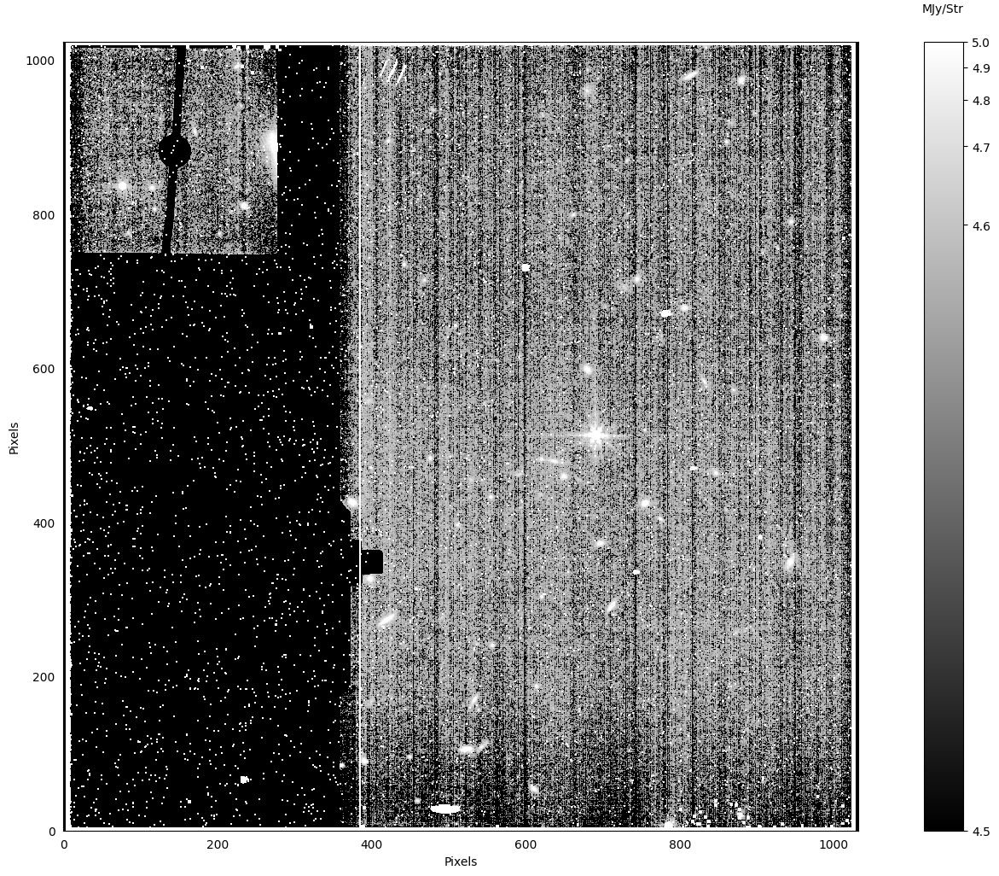

In [13]:
# Examine the First Image (Before DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data,stretch='log',min_cut=4.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

In [14]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10]=np.nan
    ref_fits.data=data
    ref_fits.save(file)

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


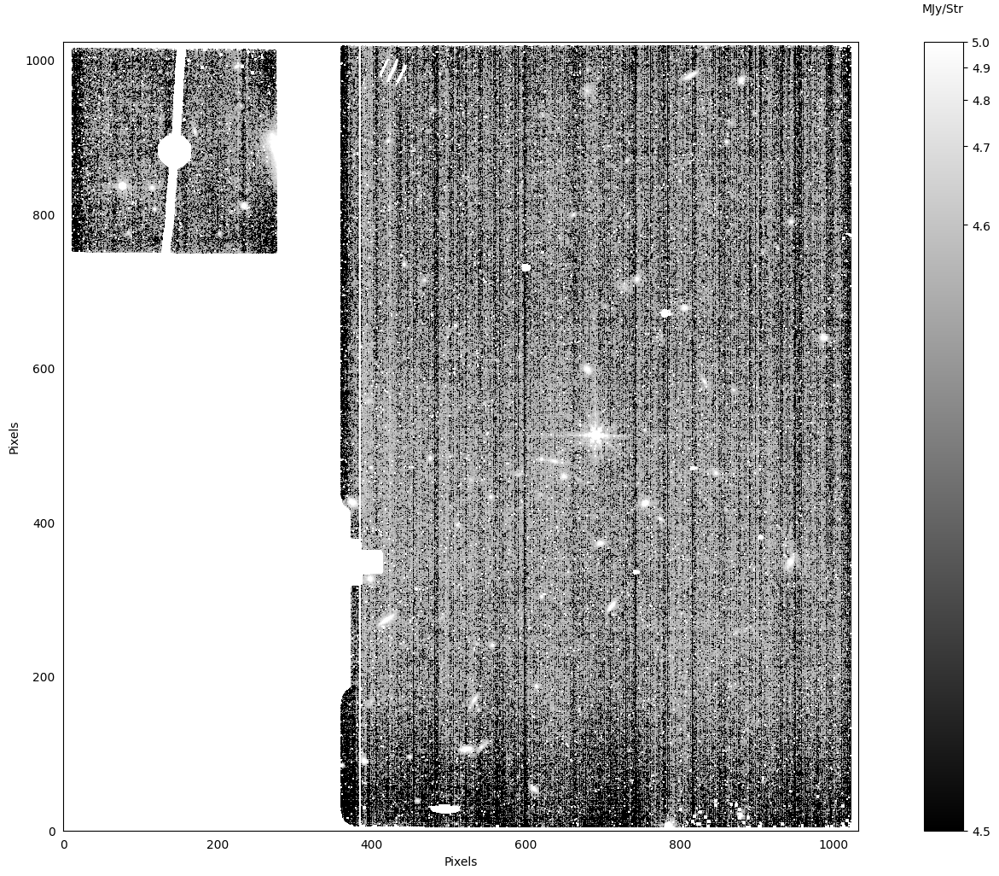

In [15]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data,stretch='log',min_cut=4.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

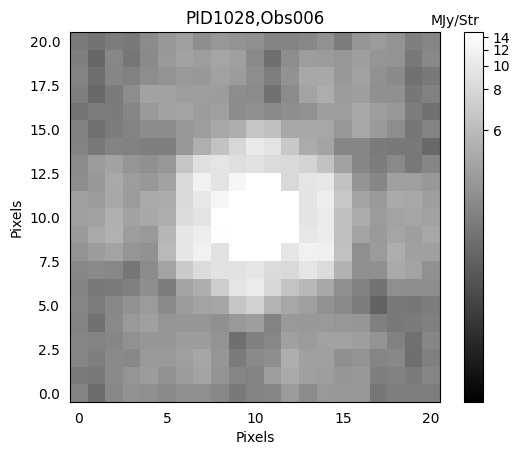

In [16]:
# Zoom in to see the source. In this case, our source is from MIRI Program ID #1028, a Calibration Program.
# We are using Visit 006, which targets the A5V dwarf 2MASSJ17430448+6655015
# Reference Link: http://simbad.cds.unistra.fr/simbad/sim-basic?Ident=2MASSJ17430448%2B6655015&submit=SIMBAD+search

source_location = SkyCoord('17:43:04.4879','+66:55:01.837',unit=(u.hourangle,u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y,ref_x = skycoord_to_pixel(source_location,ref_wcs)
ref_cutout = extract_array(ref_data,(21,21),(ref_x,ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=4.3,max_cut=15)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

#### DEV NOTES: <br> 
1. Add documentation to space_phot describing the get_jwst_psf wrapper.<br> 
2. Add documentation on using webbpsf.calc_psf instead of space_phot.get_jwst_psf to have more control over your PSF.<br>

In [17]:
# Get the PSF from WebbPSF using defaults.

jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs,source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    

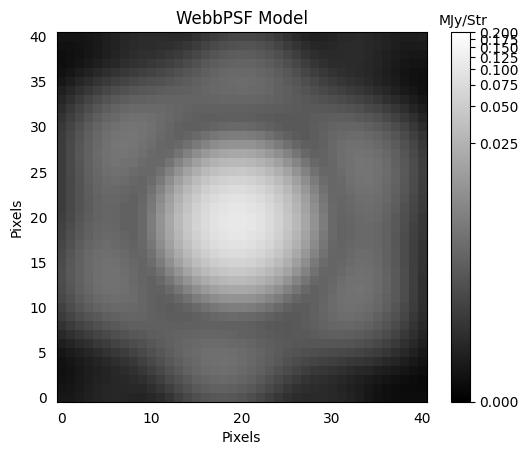

In [18]:
# The scale should highlight the background noise so it is possible to see all faint sources.

ref_cutout = extract_array(psfs[0].data,(41,41),(122,122))
#ref_cutout = psfs[0].data
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=0.0,max_cut=0.2)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

#### DEV NOTES: <br> 

1. Add improved documentation on how the fitting is performed, including packages, background, parameters, and how a calibrated flux is calculated, etc.
1. Add improved documentation on reading the plots and metrics from psf_photometry. And details about the Table Columns.
2. Add improved documentation on the various parameters and how to optimize them based on the metrics.

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.

All fitting is performed with Astropy's Photutils. As with any photometry program, the printed statistical errors are good indicators of your success.

There are different fitting techniques, but when the fit_flux parameter is set to 'single', the source is fit simultaneously in all Level2 images. There is good reason for this outlined in a paper for PSF fitting in Hubble: https://iopscience.iop.org/article/10.1086/316630/pdf

As a result, the flux and corresponding error take into account a single overall fit. As part of this, the fitting therefore assumes a constant zero point across all images. While this is not exactly true, it is typically true to within 1\% and good enough for our purposes. Users can alternatively fit with the fit_flux parameter set to 'multi', which treats each image independently. The final flux must therefore be averaged.

When you run space_phot, you will see some additional diagnositics displayed in the cell. At the top, the % value printed is the fraction of flux remaining in the residual and can be considered a good indicator of a successful model and subtraction. Next are three columns displaying the original, the model, and the residual, respectively, for each Level2 image. Finally, there are corner plots suggesting the success of the fits (more documentation and explanation of these plots is coming).

In this case, you will notice a systematic trend in the residuals. The PSF is oversubtracted in the centermost pixel and undersubtracted in the wings. The cause is unknown. It may be due to a poor PSF model. The user should consider generating more complex PSF models, but that is beyond the scope of this notebook. Nonetheless, the residual value is pretty good so the overall statistical error is relatively small.

Finished PSF psf_photometry with median residuals of 2.19%


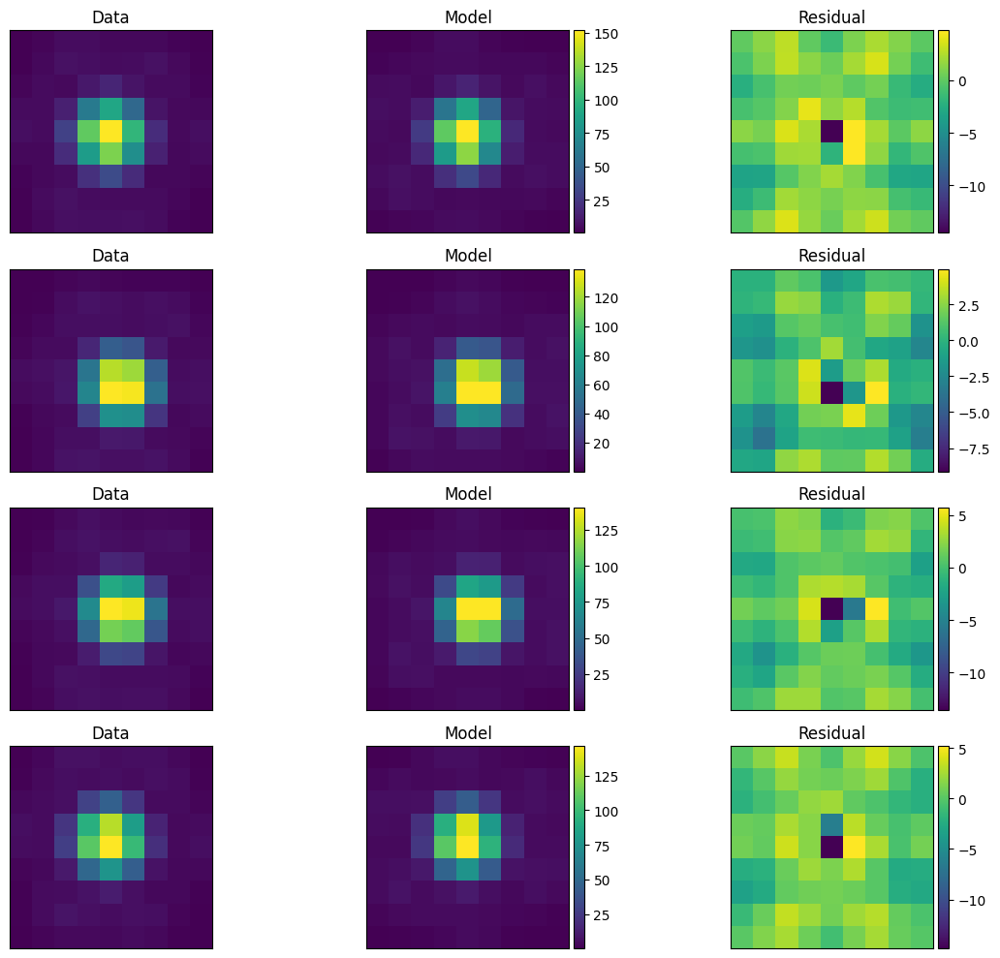

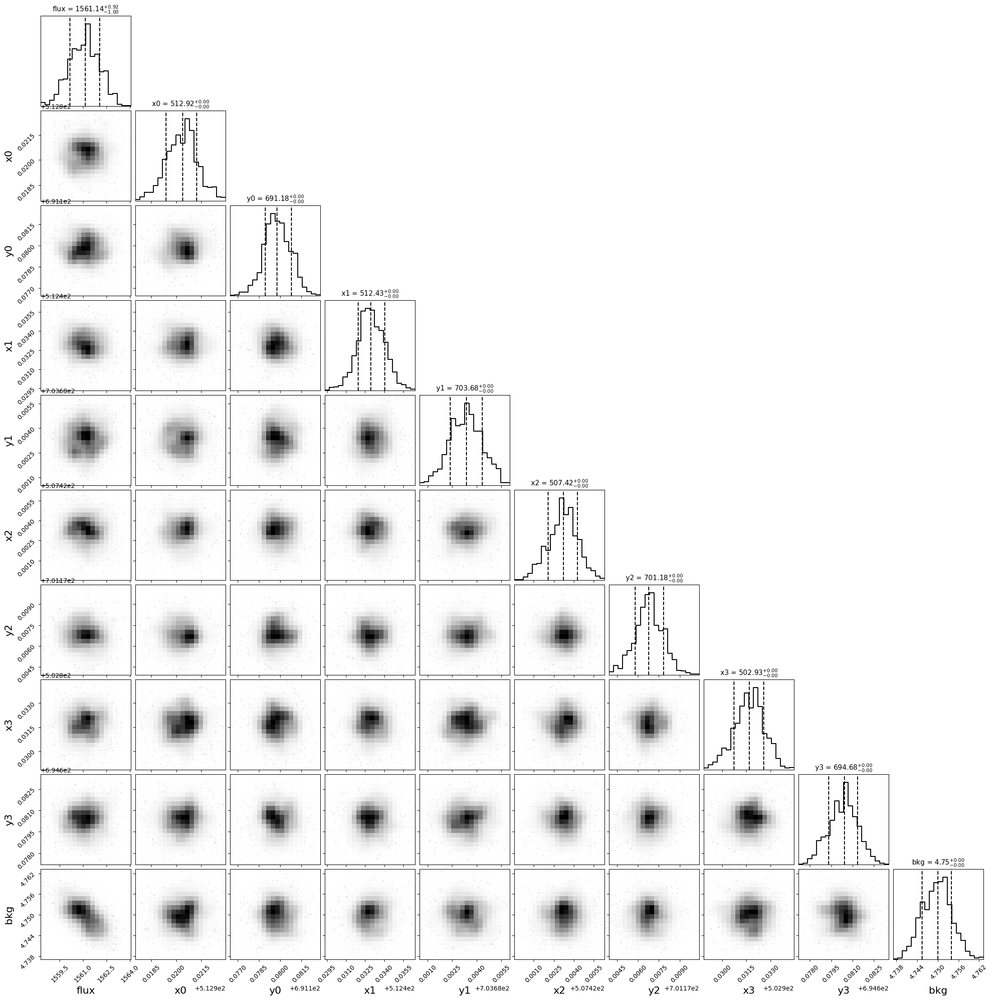

        ra                 ra_err                dec        ...         magerr        zpsys                     exp                    
------------------ ---------------------- ----------------- ... --------------------- ----- -------------------------------------------
 265.7686991751742 3.1701290481578326e-08 66.91716538739378 ... 0.0006709913428668427    ab jw01028006001_02101_00001_mirimage_cal.fits
 265.7686997363515   3.09664187625458e-08  66.9171647663078 ... 0.0006709913428668427    ab jw01028006001_02101_00002_mirimage_cal.fits
265.76869923155147  3.215097876818618e-08 66.91716507417885 ... 0.0006709913428668427    ab jw01028006001_02101_00003_mirimage_cal.fits
 265.7686989175825  3.672522552733426e-08 66.91716492327701 ... 0.0006709913428668427    ab jw01028006001_02101_00004_mirimage_cal.fits


In [19]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)

jwst_obs.psf_photometry(psfs,source_location,bounds={'flux':[-10000,10000],
                        'centroid':[-2,2],
                        'bkg':[0,50]},
                        fit_width=9,
                        fit_bkg=True,
                        fit_flux='single')
jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [20]:
jwst_obs.psf_result.phot_cal_table

ra,ra_err,dec,dec_err,x,x_err,y,y_err,mjd,flux,fluxerr,filter,zp,mag,magerr,zpsys,exp
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,str2,str43
265.7686991751742,3.1701290481578326e-08,66.91716538739378,3.953286409341672e-08,512.9203409598289,0.0009596758104794176,691.1798164569566,0.0009500923764056532,59724.05148232454,4.480042648185561e-10,2.7695483444368397e-13,F770W,-6.100000000000005,17.271794629187955,0.0006709913428668427,ab,jw01028006001_02101_00001_mirimage_cal.fits
265.7686997363515,3.09664187625458e-08,66.9171647663078,4.457244529021409e-08,512.432970667808,0.0011095435858277248,703.6833461684598,0.0010171710753537314,59724.05578601667,4.480042642041289e-10,2.769548340638469e-13,F770W,-6.100000000000005,17.271794630677018,0.0006709913428668427,ab,jw01028006001_02101_00002_mirimage_cal.fits
265.76869923155147,3.215097876818618e-08,66.91716507417885,4.532229525011644e-08,507.4231931022202,0.0011243493948558977,701.1767981371668,0.0010416830445699058,59724.06012231296,4.480042642846719e-10,2.7695483411363845e-13,F770W,-6.100000000000001,17.27179463048182,0.0006709913428668427,ab,jw01028006001_02101_00003_mirimage_cal.fits
265.7686989175825,3.672522552733426e-08,66.91716492327701,4.11342568895634e-08,502.93168417436567,0.0009771941555958286,694.6803259766094,0.0010309096867031897,59724.06439416482,4.480042645551434e-10,2.7695483428084304e-13,F770W,-6.100000000000005,17.271794629826335,0.0006709913428668427,ab,jw01028006001_02101_00004_mirimage_cal.fits


In [21]:
# Print Magnitude from Table
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).

mag_lvl2_arr = jwst_obs.psf_result.phot_cal_table['mag']
magerr_lvl2_arr = jwst_obs.psf_result.phot_cal_table['magerr']

print(mag_lvl2_arr,magerr_lvl2_arr)

       mag        
------------------
17.271794629187955
17.271794630677018
 17.27179463048182
17.271794629826335         magerr       
---------------------
0.0006709913428668427
0.0006709913428668427
0.0006709913428668427
0.0006709913428668427


In [22]:
jwst_obs_fast = space_phot.observation2(lvl2[0])

In [23]:
ref_x

array(512.58446788)

In [24]:
centers = [ref_x, ref_y]
jwst_obs_fast.fast_psf(psfs[0],centers)

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,flux_cal,fluxerr_cal,mag,magerr,zp
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,float64,float64,float64,float64,float64
1,1,0.0,691.0119292269616,512.5844678797273,1668.3570066555553,691.1737629921031,512.907927162891,1866.5606749278518,0.0008223717277391311,0.0008306204642484247,1.738190858331863,25,1,0.4411390710564359,-0.03052127073430265,0,5.356699603686055e-10,4.988300893201294e-13,17.077756768947204,0.0010105959066738154,-6.100000000000005


### 3.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="bso3"></a> ###

Despite the above discussion on performing PSF photometry on the pre-mosaiced data products, space_phot has the functionality to create a mosaiced Level3 PSF at a given single position on the detector based on the Level2 images. The advantage to this is the ability to perform PSF photometry on the deep, stacked data in cases where faint sources are expected to have prohibitively low signal-to-noise in Level2 data. The disadvantage is the amount of time required to make mosaiced Level3 PSF, so that this method is most useful when dealing with a small number of low signal-to-noise sources.<br>

Useful references:<br>
Space-Phot Documentation on Level3 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#level-3-psf<br>

In [25]:
# Level3 data file the same as above.

lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

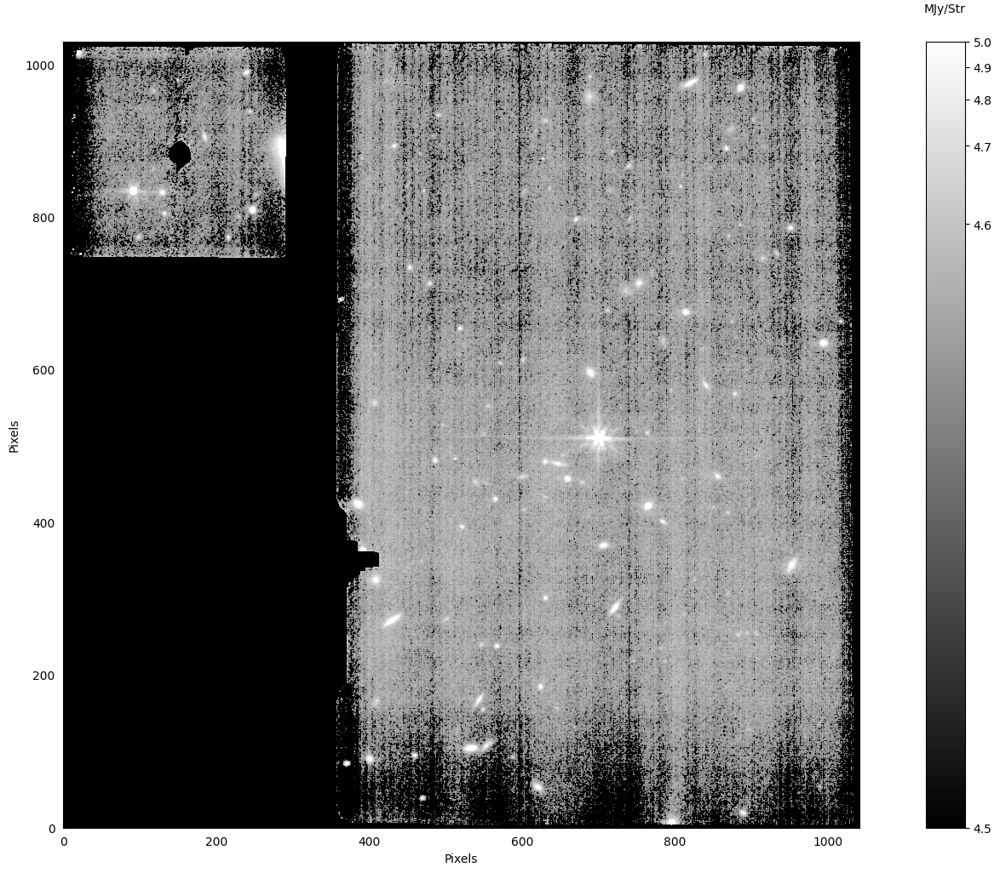

In [26]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data,stretch='log',min_cut=4.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

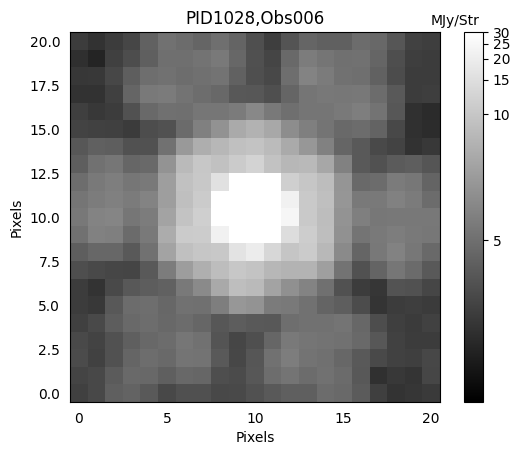

In [27]:
source_location = SkyCoord('17:43:04.4879','+66:55:01.837',unit=(u.hourangle,u.deg))

ref_wcs = ref_fits.get_fits_wcs()
ref_y,ref_x = skycoord_to_pixel(source_location,ref_wcs)
ref_cutout = extract_array(ref_data,(21,21),(ref_x,ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=4.5,max_cut=30)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

In [28]:
# Get PSF from WebbPSF

# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
    # oversample=4
    # normalize='last'
    # Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs,jwst3_obs,source_location)#,num_psfs=4)

get psfs
Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 5

2023-12-15 16:49:18,806 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.
2023-12-15 16:49:18,807 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.
2023-12-15 16:49:18,808 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.
2023-12-15 16:49:18,809 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.
2023-12-15 16:49:18,810 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.
2023-12-15 16:49:18,811 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.
2023-12-15 16:49:18,812 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.
2023-12-15 16:49:18,903 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('/Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/temp_520/cal_data_asn.json',).
2023-12-15 16:49:18,907 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline paramete

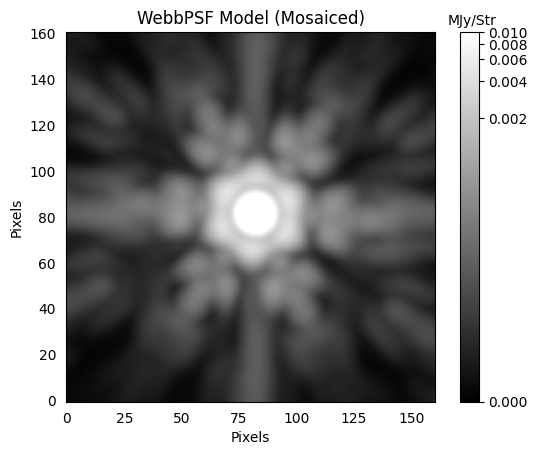

In [29]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data,(161,161),(200,200))
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=0.0,max_cut=0.01)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model (Mosaiced)')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.
See detailed notes in Section 3.1 above about the fitting process and diagnostics

In addition, consider here that jwst3_obs is generating a Level3 PSF by using the JWST pipeline to resample and combine multiple Level2 PSFs. The Level2 PSFs are generated at the precise location of the source in each Level2 file to account for detector level effects. The resampling uses default resampling paramters. However, users should be aware that if they performed customized resampling for their Level2 data products, they should use similar resampling steps for their PSF below. 

### DEV NOTE: Create a resampling step with more resampling paramaters.

Finished PSF psf_photometry with median residuals of 0.95%


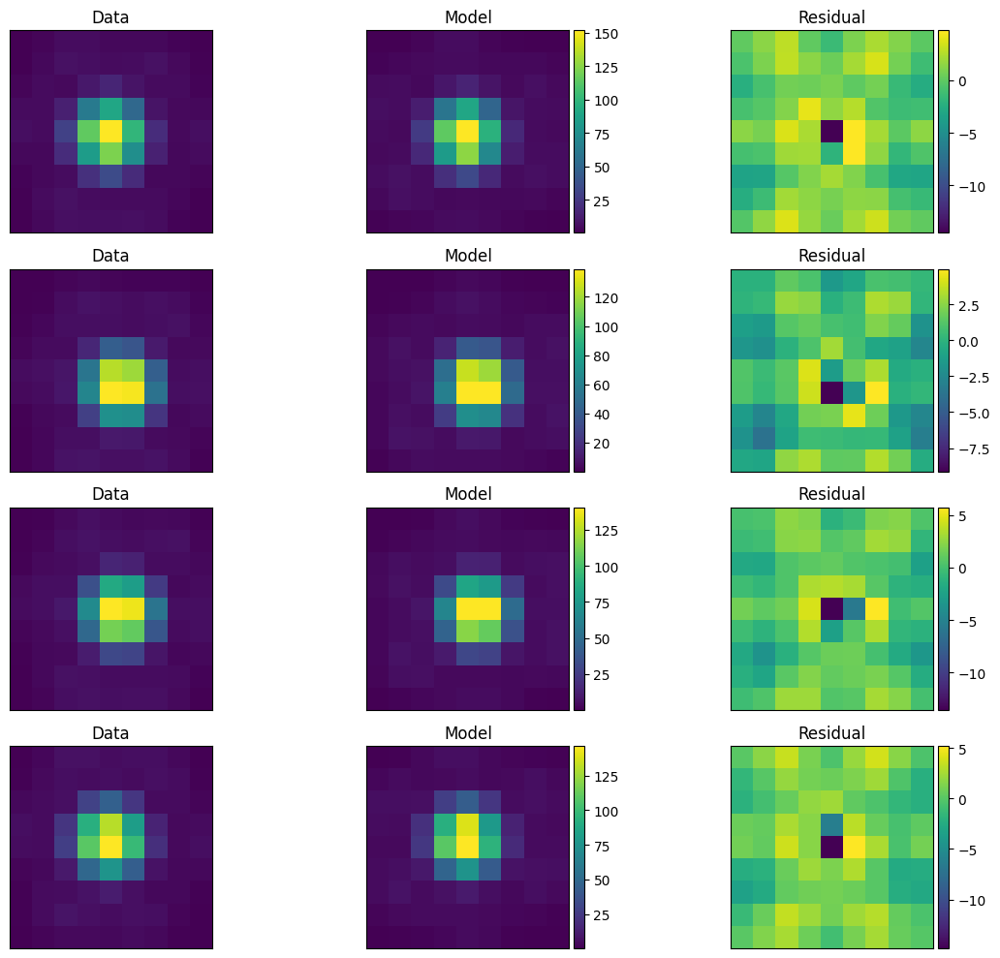

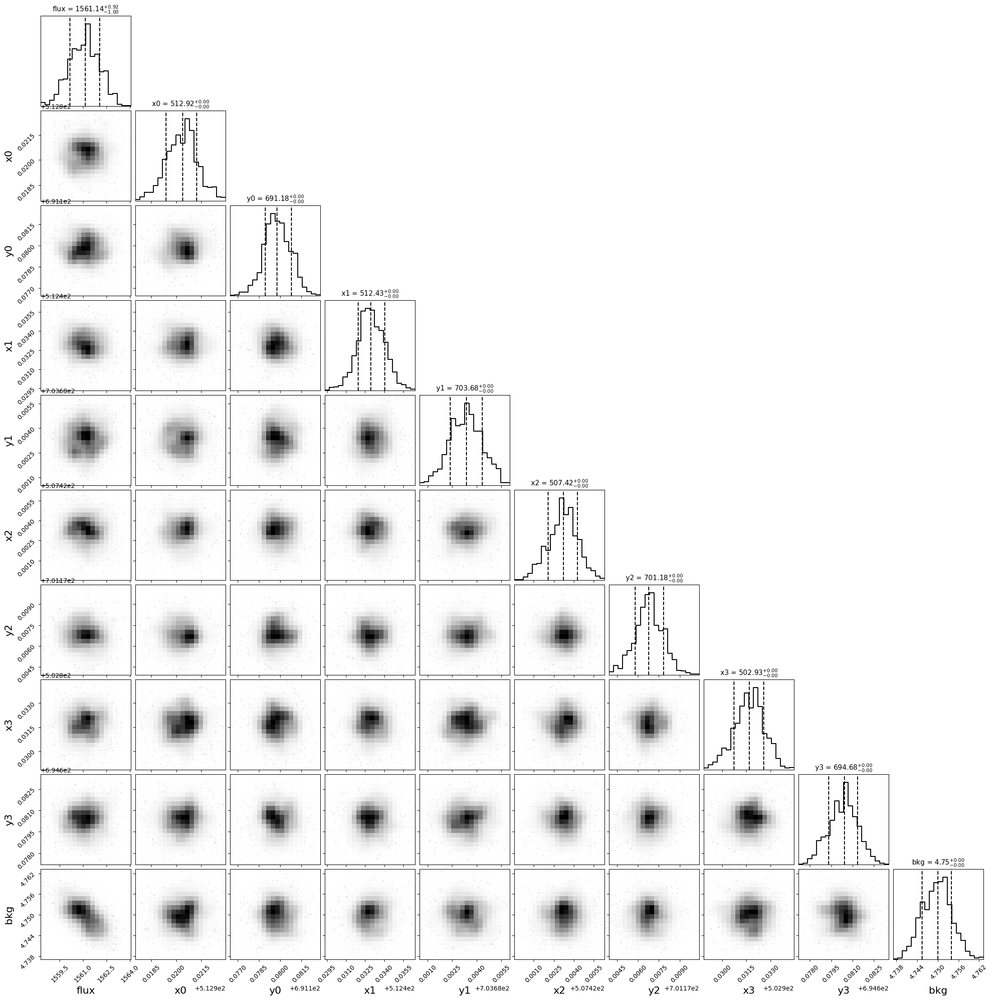

In [30]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# See detailed notes in Section 3.1 above about the fitting process and diagnostics

jwst3_obs.psf_photometry(psf3,source_location,bounds={'flux':[-10000,10000],
                        'centroid':[-2,2],
                        'bkg':[0,50]},
                        fit_width=9,
                        fit_bkg=True,
                        fit_flux=True)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [31]:
mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]
print(round(mag_lvl2_arr[0],4),round(magerr_lvl2_arr[0],4))
print(round(mag_lvl3psf,5),round(magerr_lvl3psf,5))

17.2718 0.0007
17.33988 0.00078


## Good agreement between Level2 and level3 results!

4.<font color='white'>-</font>Faint/Upper Limit, Single Object<a class="anchor" id="fso"></a>
------------------

The purpose of this section is to illustrate how to calculate an upper limit using PSF photometry a blank part of the sky. 

### 4.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="fso2"></a> ###

In [32]:
### Level 3 Files
lvl3 = ['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [33]:
### Create Level 2 Data List from ASN files
prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')
with open(asn[0],"r") as fi:
    lvl2 = []
    for ln in fi:
        #print(ln)
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])
print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


In [34]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10]=np.nan
    ref_fits.data=data
    ref_fits.save(file)

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


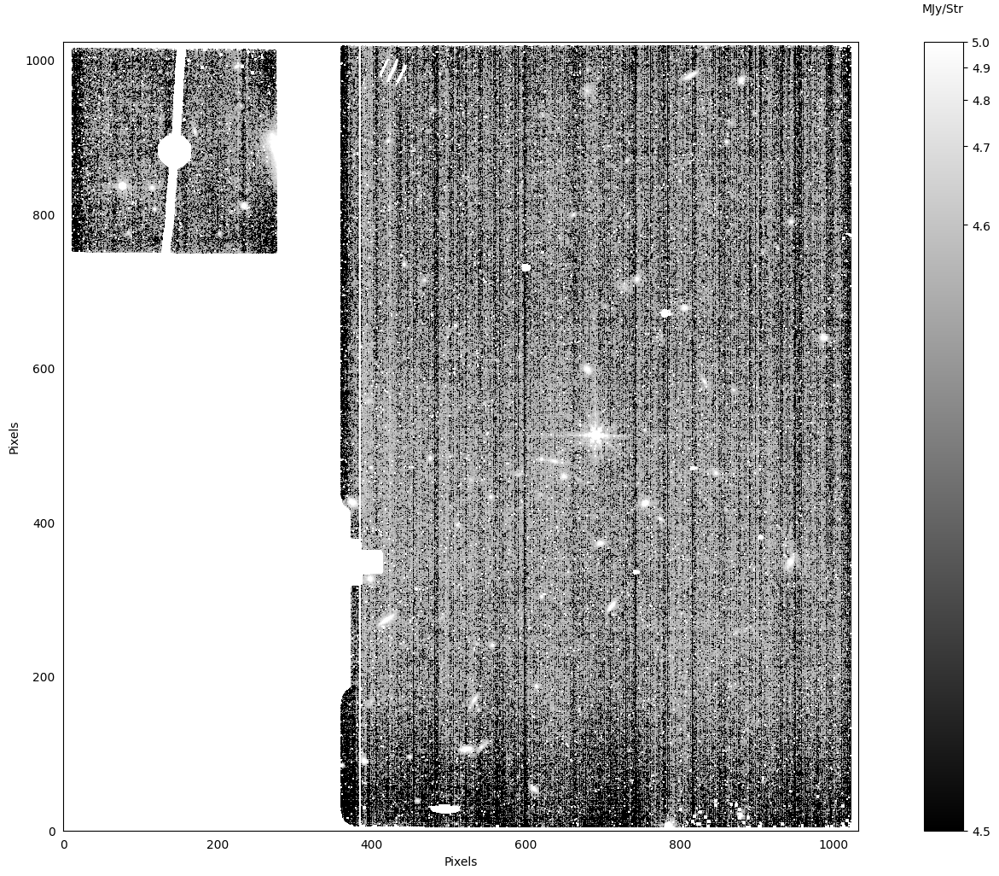

In [35]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data,stretch='log',min_cut=4.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

2023-12-15 16:49:32,916 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:14:08.073' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:16:32.375' from MJD-AVG.
Set DATE-END to '2022-05-25T01:18:56.677' from MJD-END'.
  warnings.warn(

2023-12-15 16:49:32,917 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -88.815819 from OBSGEO-[XYZ].
Set OBSGEO-B to   -27.638605 from OBSGEO-[XYZ].
Set OBSGEO-H to 1599832645.657 from OBSGEO-[XYZ]'.
  warnings.warn(



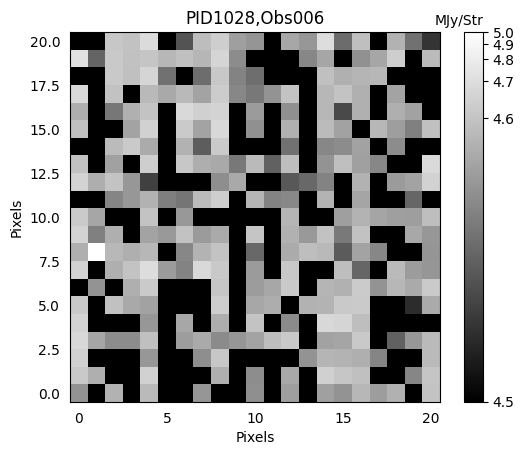

In [36]:
# Pick a blank part of the sky to calculate the upper limit

source_location = SkyCoord('17:43:00.0332','+66:54:42.677',unit=(u.hourangle,u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y,ref_x = skycoord_to_pixel(source_location,ref_wcs)
ref_cutout = extract_array(ref_data,(21,21),(ref_x,ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=4.5,max_cut=5)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

In [37]:
# Get PSF from WebbPSF
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
    # oversample=4
    # normalize='last'
    # Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs,source_location)#,num_psfs=4)

2023-12-15 16:49:33,075 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:14:08.073' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:16:32.375' from MJD-AVG.
Set DATE-END to '2022-05-25T01:18:56.677' from MJD-END'.
  warnings.warn(

2023-12-15 16:49:33,075 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -88.815819 from OBSGEO-[XYZ].
Set OBSGEO-B to   -27.638605 from OBSGEO-[XYZ].
Set OBSGEO-H to 1599832645.657 from OBSGEO-[XYZ]'.
  warnings.warn(

2023-12-15 16:49:33,083 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:20:19.912' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:22:44.214' from

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    

2023-12-15 16:49:36,800 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/instrument.py:624: DeprecationWarning: _get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.
  warnings.warn("_get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.",

2023-12-15 16:49:37,136 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:37,238 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolat

    Position 1/1 centroid: (121.51423598498249, 121.52372127635037)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


2023-12-15 16:49:39,978 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:40,079 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:49:42,425 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (121.51749095710456, 121.5232106488274)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


2023-12-15 16:49:42,769 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:42,873 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:49:45,189 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (121.51687973005787, 121.52136144048094)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


2023-12-15 16:49:45,528 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:45,632 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:49:47,893 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (121.51506255465009, 121.51974168751336)


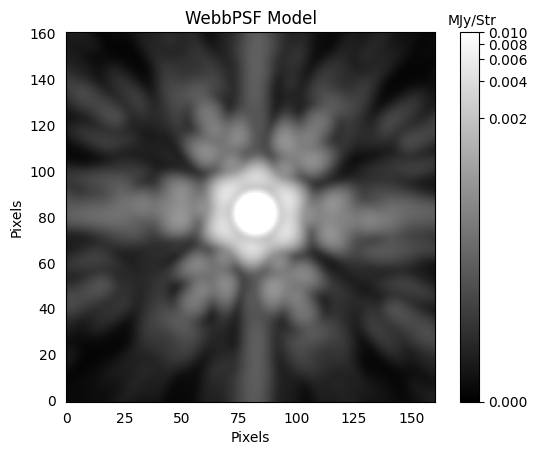

In [38]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data,(161,161),(200,200))
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=0.0,max_cut=0.01)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

2023-12-15 16:49:48,771 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/units/function/logarithmic.py:66: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))

2023-12-15 16:49:48,771 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/cal.py:32: RuntimeWarning: invalid value encountered in log10
  zp = mag.value+2.5*np.log10(flux.value)

2023-12-15 16:49:48,773 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/units/function/logarithmic.py:66: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))

2023-12-15 16:49:48,773 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/cal.py:32: RuntimeWarning: invalid value encountered in log10
  zp = mag.value+2.5*np.log10(flux.value)

2023-12-15 16:49:48,774 

Finished PSF psf_photometry with median residuals of 177.78%


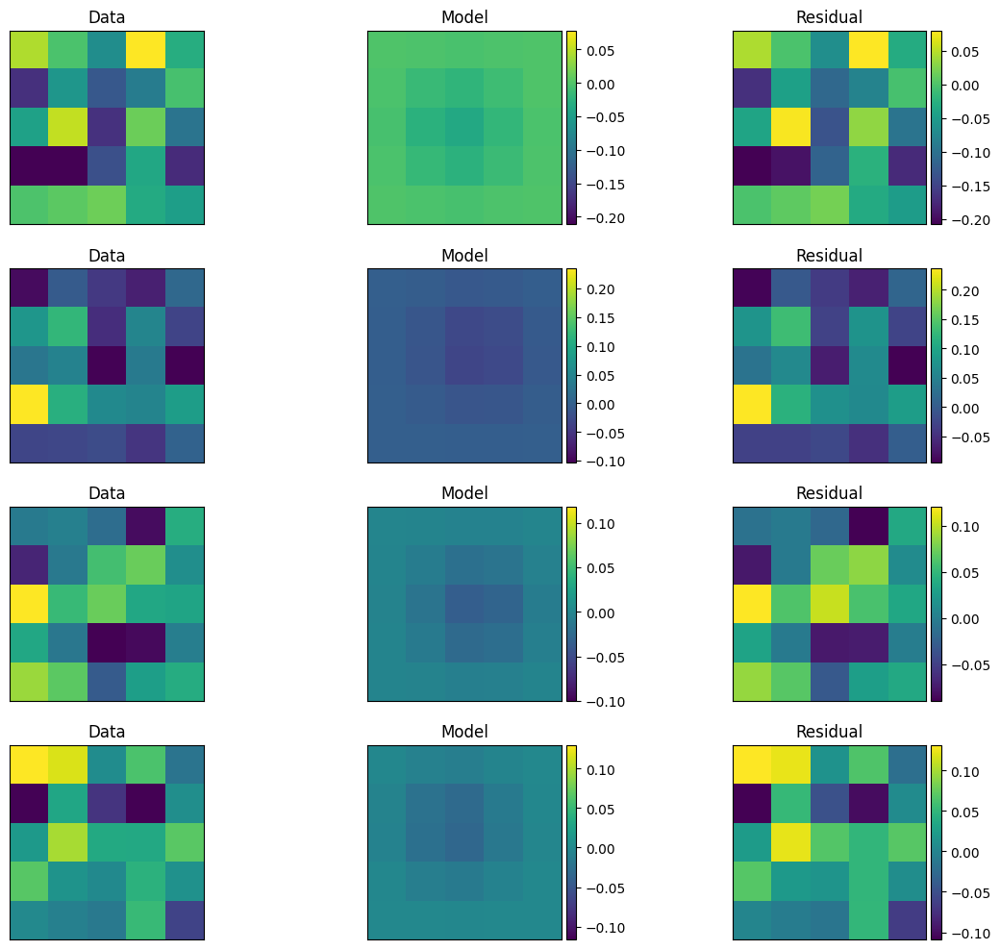

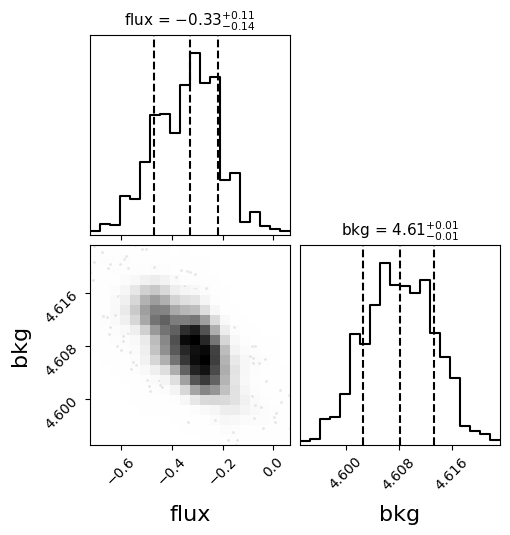

        ra                dec                            x                     ...        magerr       zpsys                     exp                    
------------------ ----------------- ----------------------------------------- ... ------------------- ----- -------------------------------------------
 265.7501383333533 66.91185472222486 Parameter('x_0', value=772.8606951131629) ... -0.5360592756297078    ab jw01028006001_02101_00001_mirimage_cal.fits
 265.7501383333496 66.91185472222436 Parameter('x_0', value=772.3294423761217) ... -0.5360592756297078    ab jw01028006001_02101_00002_mirimage_cal.fits
265.75013833334884  66.9118547222242 Parameter('x_0', value=767.3076382722813) ... -0.5360592756297078    ab jw01028006001_02101_00003_mirimage_cal.fits
 265.7501383333493  66.9118547222242 Parameter('x_0', value=762.8032192259207) ... -0.5360592756297078    ab jw01028006001_02101_00004_mirimage_cal.fits


In [39]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images

jwst_obs.psf_photometry(psfs,source_location,bounds={'flux':[-10,1000],
                        #'centroid':[-2,2],
                        'bkg':[0,50]},
                        fit_width=5,
                        fit_bkg=True,
                        fit_centroid='fixed',
                        fit_flux='single')
jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [40]:
# Print Upper Limits
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).


magupper_lvl2psf = jwst_obs.upper_limit(nsigma=5)
magupper_lvl2psf

array([25.70824045, 25.70824045, 25.70824045, 25.70824045])

### 4.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="fso3"></a> ###

In [41]:
# Level3 data file the same as above.

lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

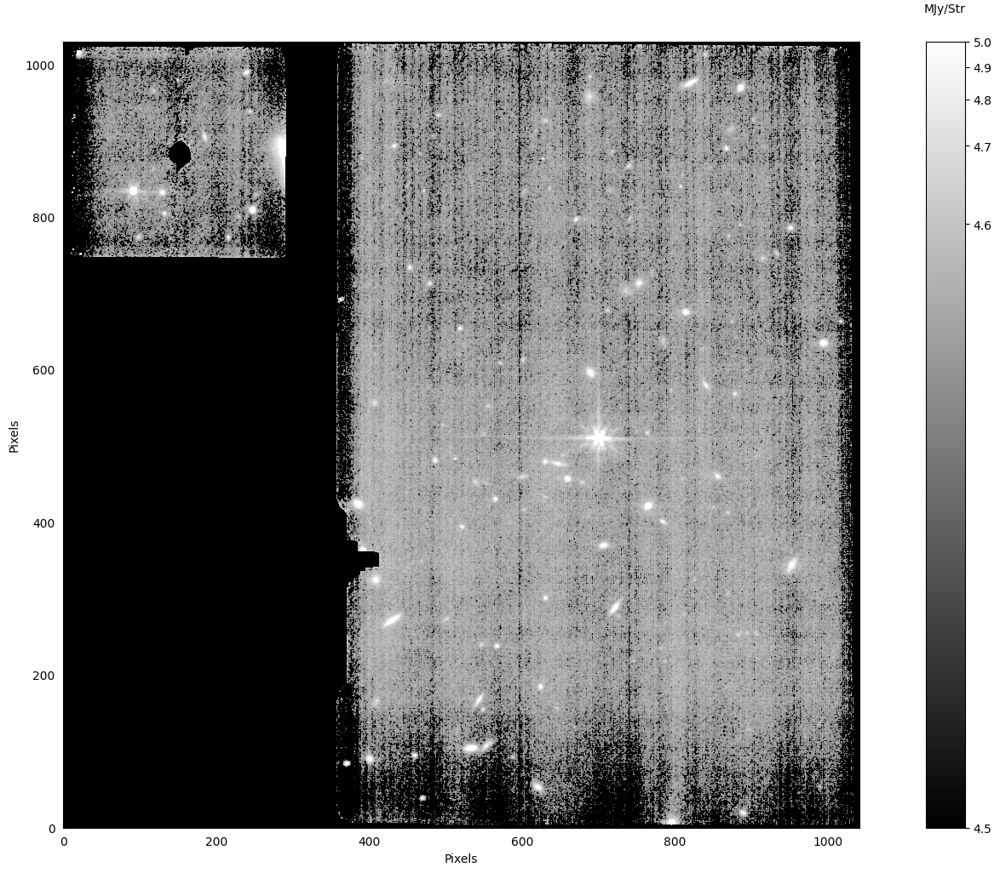

In [42]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data,stretch='log',min_cut=4.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

2023-12-15 16:49:50,230 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:14:08.073' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:25:50.854' from MJD-AVG.
Set DATE-END to '2022-05-25T01:37:32.260' from MJD-END'.
  warnings.warn(

2023-12-15 16:49:50,231 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -88.815819 from OBSGEO-[XYZ].
Set OBSGEO-B to   -27.638605 from OBSGEO-[XYZ].
Set OBSGEO-H to 1599832645.657 from OBSGEO-[XYZ]'.
  warnings.warn(



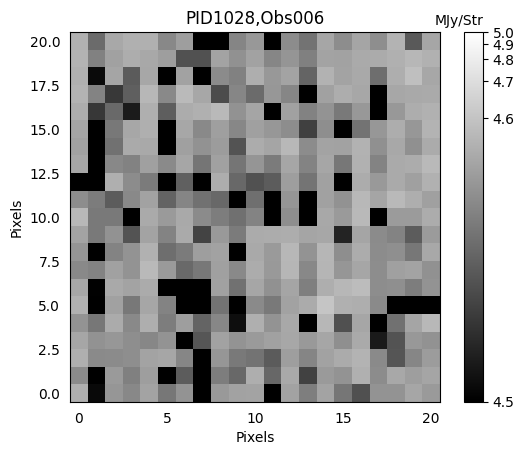

In [43]:
# Pick a blank part of the sky to calculate the upper limit

source_location = SkyCoord('17:43:00.0332','+66:54:42.677',unit=(u.hourangle,u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y,ref_x = skycoord_to_pixel(source_location,ref_wcs)
ref_cutout = extract_array(ref_data,(21,21),(ref_x,ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=4.5,max_cut=5)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

In [44]:
# Get PSF from WebbPSF
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
    # oversample=4
    # normalize='last'
    # Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf


jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs,jwst3_obs,source_location)#,num_psfs=4)

2023-12-15 16:49:50,340 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:14:08.073' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:25:50.854' from MJD-AVG.
Set DATE-END to '2022-05-25T01:37:32.260' from MJD-END'.
  warnings.warn(

2023-12-15 16:49:50,341 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -88.815819 from OBSGEO-[XYZ].
Set OBSGEO-B to   -27.638605 from OBSGEO-[XYZ].
Set OBSGEO-H to 1599832645.657 from OBSGEO-[XYZ]'.
  warnings.warn(

2023-12-15 16:49:50,342 - stpipe - WARNING - /var/folders/yh/kl4y3s1x3_j3ywy3qq67g3vc0001kc/T/ipykernel_58728/282043244.py:11: ResourceWarning: unclosed file <_io.BufferedReader name='./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits'>
  jwst3_obs = space_phot.observation3(lvl3[0])


get psfs
Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 5

2023-12-15 16:49:54,021 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/instrument.py:624: DeprecationWarning: _get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.
  warnings.warn("_get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.",

2023-12-15 16:49:54,347 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:54,451 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolat

    Position 1/1 centroid: (201.51423598498272, 201.52372127635073)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


2023-12-15 16:49:57,242 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:49:57,345 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:49:59,844 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (201.51749095710454, 201.52321064882798)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


2023-12-15 16:50:00,201 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:50:00,303 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:50:02,948 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (201.5168797300571, 201.52136144048103)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


2023-12-15 16:50:03,303 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 16:50:03,407 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 16:50:05,888 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 1/1 centroid: (201.51506255465037, 201.51974168751337)
got psfs


2023-12-15 16:50:06,178 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/util.py:319: ResourceWarning: unclosed file <_io.BufferedReader name='./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits'>
  dat = fits.open(f)

2023-12-15 16:50:06,187 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-05-25T01:20:19.912' from MJD-BEG.
Set DATE-AVG to '2022-05-25T01:22:44.214' from MJD-AVG.
Set DATE-END to '2022-05-25T01:25:08.516' from MJD-END'.
  warnings.warn(

2023-12-15 16:50:06,187 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -88.812458 from OBSGEO-[XYZ].
Set OBSGEO-B to   -27.640625 from OBSGEO-[XYZ].
Set OBSGEO-H to 1599859842.580 from OBSGEO-[XYZ]'.
  warnings.warn(

2023-12-

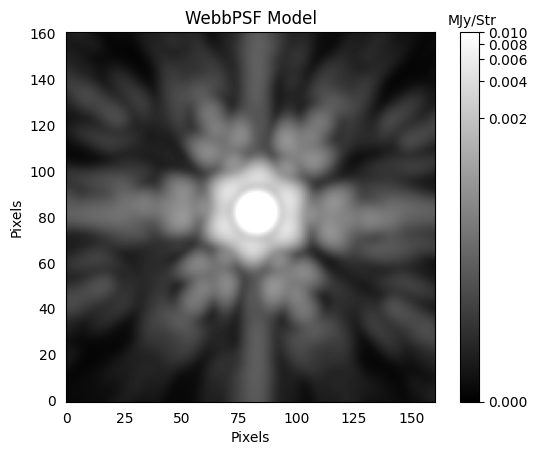

In [45]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data,(161,161),(200,200))
norm1 = simple_norm(ref_cutout,stretch='log',min_cut=0.0,max_cut=0.01)
plt.imshow(ref_cutout,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both',color='none')
plt.show()

2023-12-15 16:50:11,813 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/units/function/logarithmic.py:66: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))

2023-12-15 16:50:11,814 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/cal.py:32: RuntimeWarning: invalid value encountered in log10
  zp = mag.value+2.5*np.log10(flux.value)



Finished PSF psf_photometry with median residuals of -10.20%


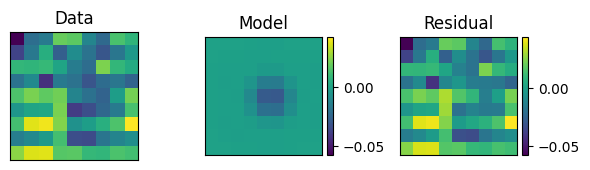

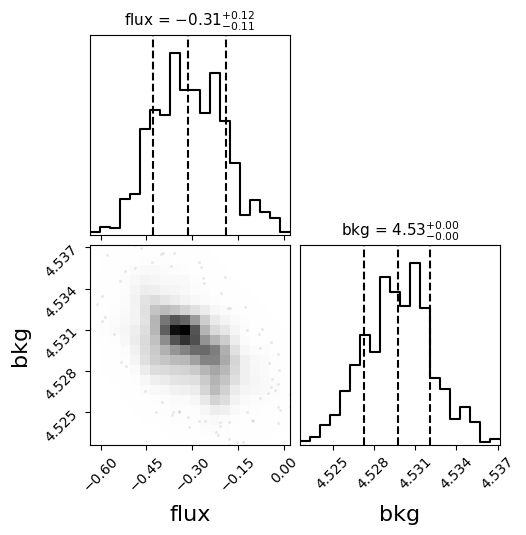

In [46]:
jwst3_obs.psf_photometry(psf3,source_location,bounds={'flux':[-1000,1000],
                        #'centroid':[-2,2],
                        'bkg':[0,50]},
                        fit_width=9,
                        fit_bkg=True, 
                        fit_centroid=False,
                        fit_flux=True)

jwst3_obs.plot_psf_fit()
plt.show()

jwst3_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [47]:
magupper_lvl3psf = jwst3_obs.upper_limit(nsigma=5)
print(round(magupper_lvl2psf[0],4))
print(round(magupper_lvl3psf[0],5))

2023-12-15 16:50:12,103 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/space_phot/cal.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return(flux.value,fluxerr.value,mag.value,magerr,float(zp))



25.7082
25.82255


## Note you can go significantly deeper with the Level3 combined data product

5.<font color='white'>-</font>Stellar Field (LMC)<a class="anchor" id="lmc"></a>
------------------

#### In this case, we are going to do the same steps as in Section 3, but for multiple stars. The purpose is to illustrate the workflow and runtime for using space_phot on a large number of stars. We suggest that space_phot may be less optimal for large numbers of bright stars. Other programs, such as DOLPHOT or Photutils, may be better suited for this use case. The primary advantage to space_phot is on faint, single sources. But it can be extended to a larger number if desired.

### 5.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="lmc2"></a> ###

##### Now do the same thing for a larger group of stars and test for speed

In [48]:
### Level 3 Files
#lvl3 = ['mastDownload/JWST/jw01171-o004_t001_miri_f560w/jw01171-o004_t001_miri_f560w_i2d.fits']
lvl3 = ["./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits"]
lvl3

['./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits']

In [49]:
### Level 2 Files
#lvl2 = glob.glob('mastDownload/JWST/jw01171004*/*cal.fits')

lvl2 = glob.glob('./mast/01171/jw01171004*cal.fits')
lvl2

['./mast/01171/jw01171004001_02101_00001_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits']

In [50]:
# Find Stars in Level 3 File

# Get rough estimate of background (There are Better Ways to Do Background Subtraction)
bkgrms = MADStdBackgroundRMS()
mmm_bkg = MMMBackground()

#im = fits.open(lvl3[0]) 
#w = wcs.WCS(im['SCI',1])

ref_fits = ImageModel(lvl3[0])
w = ref_fits.get_fits_wcs()

#std = bkgrms(im[1].data)
#bkg = mmm_bkg(im[1].data)
#data_bkgsub = im[1].data.copy()

std = bkgrms(ref_fits.data)
bkg = mmm_bkg(ref_fits.data)
data_bkgsub = ref_fits.data.copy()
data_bkgsub -= bkg        
sigma_psf = 1.636 #pixls for F770W
threshold = 5.

daofind = DAOStarFinder(threshold=threshold * std, fwhm=sigma_psf, exclude_border=True)
found_stars = daofind(data_bkgsub)

2023-12-15 17:18:32,167 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-04-13T02:54:45.779' from MJD-BEG.
Set DATE-AVG to '2022-04-13T03:02:43.792' from MJD-AVG.
Set DATE-END to '2022-04-13T03:10:40.430' from MJD-END'.
  warnings.warn(

2023-12-15 17:18:32,168 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -145.812130 from OBSGEO-[XYZ].
Set OBSGEO-B to     4.117659 from OBSGEO-[XYZ].
Set OBSGEO-H to 1239717639.117 from OBSGEO-[XYZ]'.
  warnings.warn(



In [51]:
found_stars.pprint_all(max_lines=10)

 id      xcentroid         ycentroid          sharpness       roundness1      roundness2      npix sky         peak                flux                 mag         
---- ----------------- ------------------ ------------------ ----------- -------------------- ---- --- -------------------- ------------------ ---------------------
   1 546.3366588406968  5.398882130273244 0.7216108098543021  0.42706507   0.0327047943515513   25 0.0  -0.8653272390365601 1.6044420003890991   -0.5133100555790514
   2 579.1090334369383  5.270107063151424 0.7034689294973233 -0.07913096  -0.8541384674101066   25 0.0   -0.670994758605957 1.0608985424041748  -0.06418463180595671
   3 583.2893136620834  5.869637735574443 0.8212823650919728 -0.49647078   0.7449057965878985   25 0.0  -0.5979987382888794 1.4969946146011353   -0.4380505949571353
 ...               ...                ...                ...         ...                  ...  ... ...                  ...                ...                   ...
1020 823.1

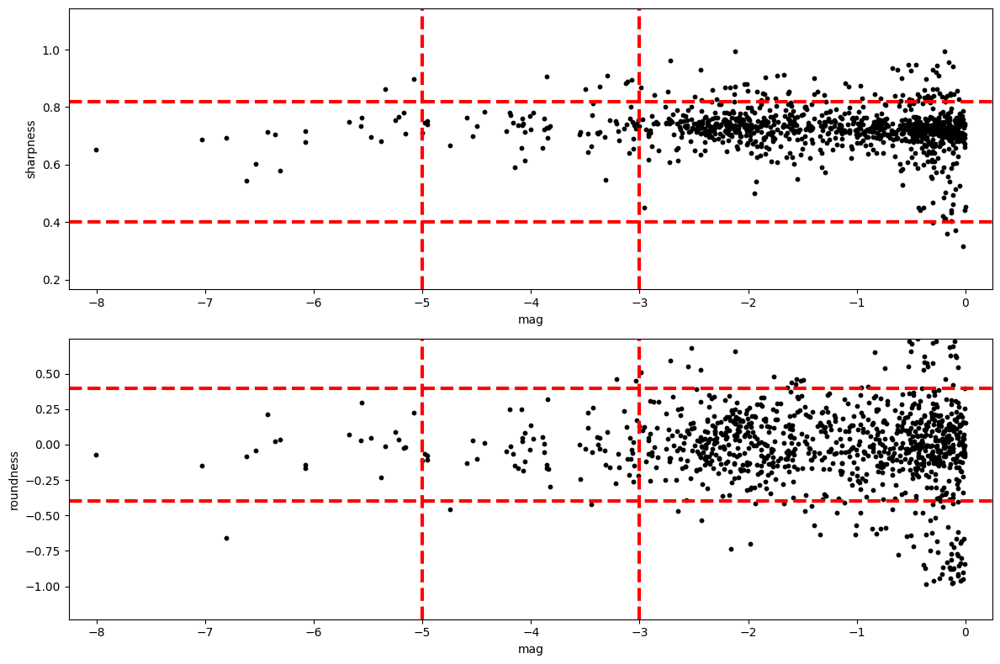

In [52]:
# Filter out only stars you want

plt.figure(figsize=(12, 8))
plt.clf()

ax1 = plt.subplot(2, 1, 1)

ax1.set_xlabel('mag')
ax1.set_ylabel('sharpness')

xlim0 = np.min(found_stars['mag']) - 0.25
xlim1 = np.max(found_stars['mag']) + 0.25
ylim0 = np.min(found_stars['sharpness']) - 0.15
ylim1 = np.max(found_stars['sharpness']) + 0.15

ax1.set_xlim(xlim0, xlim1)
ax1.set_ylim(ylim0, ylim1)

#ax1.xaxis.set_major_locator(ticker.AutoLocator())
#ax1.xaxis.set_minor_locator(ticker.AutoMinorLocator())
#ax1.yaxis.set_major_locator(ticker.AutoLocator())
#ax1.yaxis.set_minor_locator(ticker.AutoMinorLocator())

ax1.scatter(found_stars['mag'], found_stars['sharpness'], s=10, color='k')

sh_inf = 0.40
sh_sup = 0.82
#mag_lim = -5.0
lmag_lim = -3.0
umag_lim = -5.0

ax1.plot([xlim0, xlim1], [sh_sup, sh_sup], color='r', lw=3, ls='--')
ax1.plot([xlim0, xlim1], [sh_inf, sh_inf], color='r', lw=3, ls='--')
ax1.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax1.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

ax2 = plt.subplot(2, 1, 2)

ax2.set_xlabel('mag')
ax2.set_ylabel('roundness')

ylim0 = np.min(found_stars['roundness2']) - 0.25
ylim1 = np.max(found_stars['roundness2']) - 0.25

ax2.set_xlim(xlim0, xlim1)
ax2.set_ylim(ylim0, ylim1)

#ax2.xaxis.set_major_locator(ticker.AutoLocator())
#ax2.xaxis.set_minor_locator(ticker.AutoMinorLocator())
#ax2.yaxis.set_major_locator(ticker.AutoLocator())
#ax2.yaxis.set_minor_locator(ticker.AutoMinorLocator())

round_inf = -0.40
round_sup = 0.40

ax2.scatter(found_stars['mag'], found_stars['roundness2'], s=10, color='k')

ax2.plot([xlim0, xlim1], [round_sup, round_sup], color='r', lw=3, ls='--')
ax2.plot([xlim0, xlim1], [round_inf, round_inf], color='r', lw=3, ls='--')
ax2.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax2.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

plt.tight_layout()

In [53]:
mask = ((found_stars['mag'] < lmag_lim) & (found_stars['mag'] > umag_lim) & (found_stars['roundness2'] > round_inf)
        & (found_stars['roundness2'] < round_sup) & (found_stars['sharpness'] > sh_inf) 
        & (found_stars['sharpness'] < sh_sup) & (found_stars['xcentroid'] > 100) & (found_stars['xcentroid'] < 700)
        & (found_stars['ycentroid'] > 100) & (found_stars['ycentroid'] < 700))

found_stars_sel = found_stars[mask]

print('Number of stars found originally:', len(found_stars))
print('Number of stars in final selection:', len(found_stars_sel))


Number of stars found originally: 1022
Number of stars in final selection: 13


In [54]:
found_stars_sel

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float32,float64,int64,float64,float64,float64,float64
154,378.7447860048902,106.99556381787069,0.746396419837587,-0.060909897,-0.06528081842863379,25,0.0,51.20432662963867,46.19735336303711,-4.161542739066019
163,699.3979436707866,121.32571956929932,0.6839113896426745,-0.44503638,-0.16064184840194462,25,0.0,21.92721176147461,18.855628967285156,-3.18860255936475
215,520.4738859889501,190.2470844467611,0.801939515793906,0.29336134,-0.10283372682390177,25,0.0,23.034168243408203,17.11179542541504,-3.083238948815109
218,591.9608924578399,194.86544163362754,0.7537782857133695,-0.37401316,-0.2174607202451072,25,0.0,21.18755340576172,15.98092269897461,-3.0090046269794324
252,388.9901978969254,248.16827827738035,0.726416615195482,0.20260607,0.2397623279230829,25,0.0,19.440757751464844,18.035749435424805,-3.1403354829247307
270,532.4073709451064,267.73564351673207,0.7293613535465368,-0.2966984,-0.16983160454011637,25,0.0,43.17793273925781,34.43391418457031,-3.8424659819824254
355,671.4881295228383,370.5420770001648,0.6900003175282557,0.20748842,-0.26339732280995043,25,0.0,21.814945220947266,16.73634147644043,-3.059151320785358
425,635.9256442579762,494.58156627181285,0.8118165178964439,-0.07866803,0.25792515575227165,25,0.0,29.927074432373047,23.537675857543945,-3.4294089444763682
502,584.9740628030005,576.5201775316028,0.7828437409321344,-0.21265483,0.009297936681535182,25,0.0,76.73455047607422,58.97472381591797,-4.426664789302999


In [55]:
# Convert pixel to wcs coords
from astropy.wcs.utils import skycoord_to_pixel
skycoords = w.pixel_to_world(found_stars_sel['xcentroid'], found_stars_sel['ycentroid'])
skycoords = skycoords[9:] #Cutting down the list artificially to make things run faster
len(skycoords)

4

In [56]:
# Change all DQ flagged pixels to NANs
for file in lvl2:
    #hdul = fits.open(file, mode='update')
    #data = fits.open(file)['SCI',1].data
    #dq = fits.open(file)['DQ',1].data
    #data[dq == 262657]=np.nan
    #data[dq == 262661]=np.nan
    #hdul['SCI',1].data=data
    #hdul.flush()

    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10]=np.nan
    ref_fits.data=data
    ref_fits.save(file)

In [57]:
# Create a grid for fast lookup using WebbPSF. The larger the number of grid points, the better the photometric precision.
# Developer note. Would be great to have a fast/approximate look up table. 
jwst_obs = space_phot.observation2(lvl2)
grid = space_phot.util.get_jwst_psf_grid(jwst_obs,num_psfs=4)

2023-12-15 17:18:34,821 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-04-13T02:54:45.779' from MJD-BEG.
Set DATE-AVG to '2022-04-13T02:56:00.705' from MJD-AVG.
Set DATE-END to '2022-04-13T02:57:15.631' from MJD-END'.
  warnings.warn(

2023-12-15 17:18:34,822 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -145.812130 from OBSGEO-[XYZ].
Set OBSGEO-B to     4.117659 from OBSGEO-[XYZ].
Set OBSGEO-H to 1239717639.117 from OBSGEO-[XYZ]'.
  warnings.warn(

2023-12-15 17:18:34,829 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-04-13T03:08:10.578' from MJD-BEG.
Set DATE-AVG to '2022-04-13T03:09:25.504' from

Setting up sim to match ./mast/01171/jw01171004001_02101_00001_mirimage_cal.fits

MAST OPD query around UTC: 2022-04-13T02:54:45.779
                        MJD: 59682.12136318287

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3423 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7187 days
User requested choosing OPD time closest in time to 2022-04-13T02:54:45.779, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.342 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupi

2023-12-15 17:18:37,534 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/instrument.py:624: DeprecationWarning: _get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.
  warnings.warn("_get_optical_system is deprecated; use get_optical_system (without leading underscore) instead.",

2023-12-15 17:18:37,747 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/opds.py:1746: UserWarning: For (V2,V3) = [-6.36389848 -7.26853851] arcmin, Field point -6.3638984816102235 arcmin, -0.5632056 arcmin not within valid region for field dependence model of OTE WFE for MIRI: -8.254199999999999 arcmin--6.21738 arcmin, -2.557224 arcmin--0.5632056 arcmin. Clipping to closest available valid location, 0.031744109903437345 arcmin away from the requested coordinates.
  warnings.warn(f'For (V2,V3) = {v2v3}, Field point {x_field_pt}, {y_field_pt} not within valid region for field

    Position 1/4 centroid: (201.39899064460195, 201.57452965070618)
    Position 2/4: (0, 1023) pixels


2023-12-15 17:18:40,932 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/opds.py:1746: UserWarning: For (V2,V3) = [-6.21257653 -5.39972458] arcmin, Field point -6.21738 arcmin, -2.4002754231217454 arcmin not within valid region for field dependence model of OTE WFE for MIRI: -8.254199999999999 arcmin--6.21738 arcmin, -2.557224 arcmin--0.5632056 arcmin. Clipping to closest available valid location, 0.00480347054204433 arcmin away from the requested coordinates.
  warnings.warn(f'For (V2,V3) = {v2v3}, Field point {x_field_pt}, {y_field_pt} not within valid region for field dependence model of OTE WFE for {instrument}: {min_x_field}-{max_x_field}, {min_y_field}-{max_y_field}. Clipping to closest available valid location, {clip_dist} away from the requested coordinates.')

2023-12-15 17:18:41,197 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `

    Position 2/4 centroid: (201.30668791886148, 201.41337987755603)
    Position 3/4: (1023, 0) pixels


2023-12-15 17:18:44,247 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 17:18:44,349 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 17:18:46,811 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/instrument.py:624: DeprecationWarning: _get_optical_system is deprecated; use get_optical_system (without leading underscore) in

    Position 3/4 centroid: (201.4421917273397, 201.69977343735653)
    Position 4/4: (1023, 1023) pixels


2023-12-15 17:18:47,277 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:891: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_real = scipy.ndimage.interpolation.rotate(self.wavefront.real, -angle, reshape=False)  # negative = CCW

2023-12-15 17:18:47,381 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/poppy/poppy_core.py:892: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  rot_imag = scipy.ndimage.interpolation.rotate(self.wavefront.imag, -angle, reshape=False)

2023-12-15 17:18:49,885 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/webbpsf/gridded_library.py:430: DeprecationWarning: `photutils.GriddedPSFModel` is a deprecated alias for `photutils.psf.GriddedPSFMod

    Position 4/4 centroid: (201.77315408011256, 201.6032560744759)
  Saving file: miri_mirim_f560w_fovp101_samp4_npsf4.fits


In [58]:
from astropy.io import ascii
from astropy.table import QTable

t = QTable([skycoords], names=["skycoord"])
t.write('skycoord.ecsv',overwrite=True)

#### DEV NOTE: allow space_phot to take pixel coordinates as input

#### DEV NOTE: Open WebbPSF ticket for webbpsf.gridded_library.CreatePSFLibrary, which is called in get_jwst_psf_from_grid below. The reason for this is that the output from that command currently prints: Position 2/4 centroid: (201.3017584451758, 201.31980818321827), but this is the lower corner of the array. We want a grid across the entire array. The notebook can currently be run as is.

In [59]:
lvl2

['./mast/01171/jw01171004001_02101_00001_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits']

#### Dev Note: Need Grid Capability for Level3 Data for fater PSF Generation

2023-12-15 17:18:50,330 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/io/fits/util.py:186: ResourceWarning: unclosed file <_io.BufferedReader name='./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits'>
  for sub in sorted(subs, key=operator.attrgetter("__name__")):

2023-12-15 17:18:50,381 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-04-13T02:54:45.779' from MJD-BEG.
Set DATE-AVG to '2022-04-13T02:56:00.705' from MJD-AVG.
Set DATE-END to '2022-04-13T02:57:15.631' from MJD-END'.
  warnings.warn(

2023-12-15 17:18:50,381 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -145.812130 from OBSGEO-[XYZ].
Set OBSGEO-B to     4.117659 from OBSGEO-[XYZ].
Set OBSGEO

Starting 1.0  of 4 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72803877, -69.45133743)>
Finished PSF psf_photometry with median residuals of 4.94%


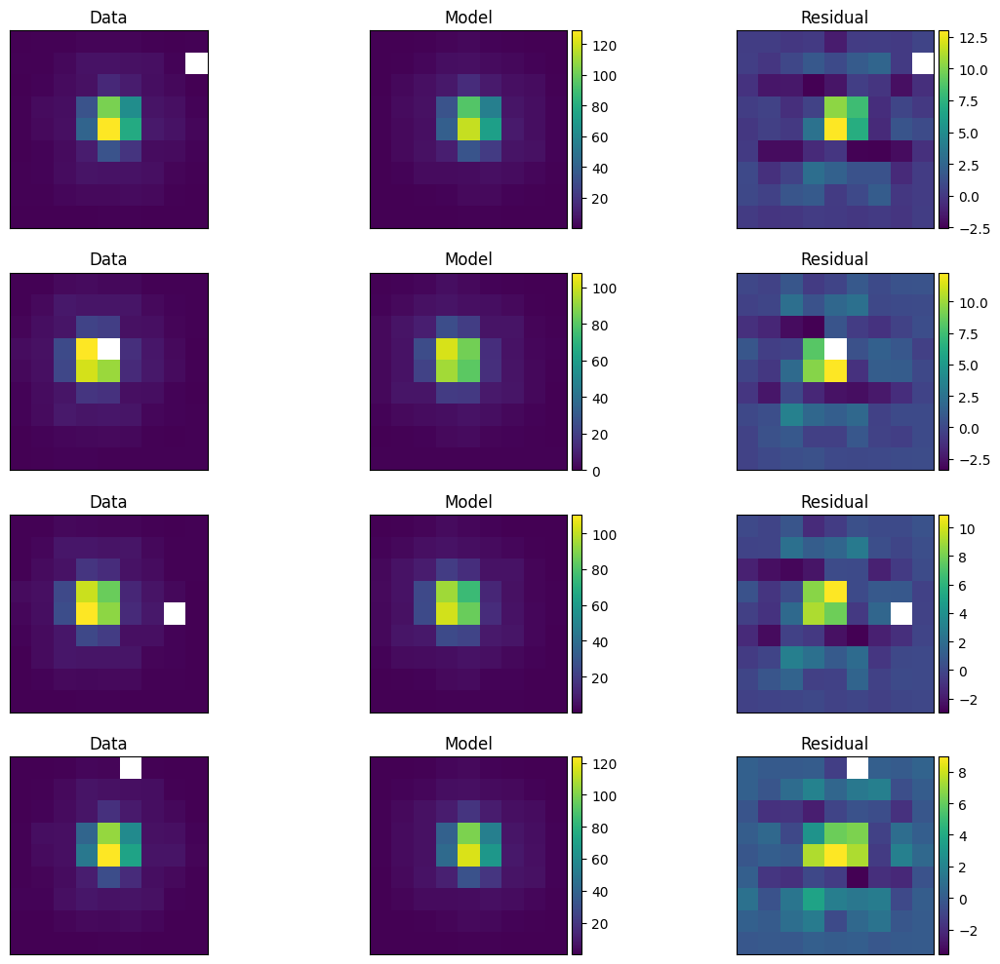

Elapsed Time for Photometry: 12.154045000090264
Starting 2.0  of 4 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73746115, -69.44890936)>


2023-12-15 17:19:10,477 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/nestle.py:388: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  cov = make_eigvals_positive(cov, targetprod)



Finished PSF psf_photometry with median residuals of 3.26%


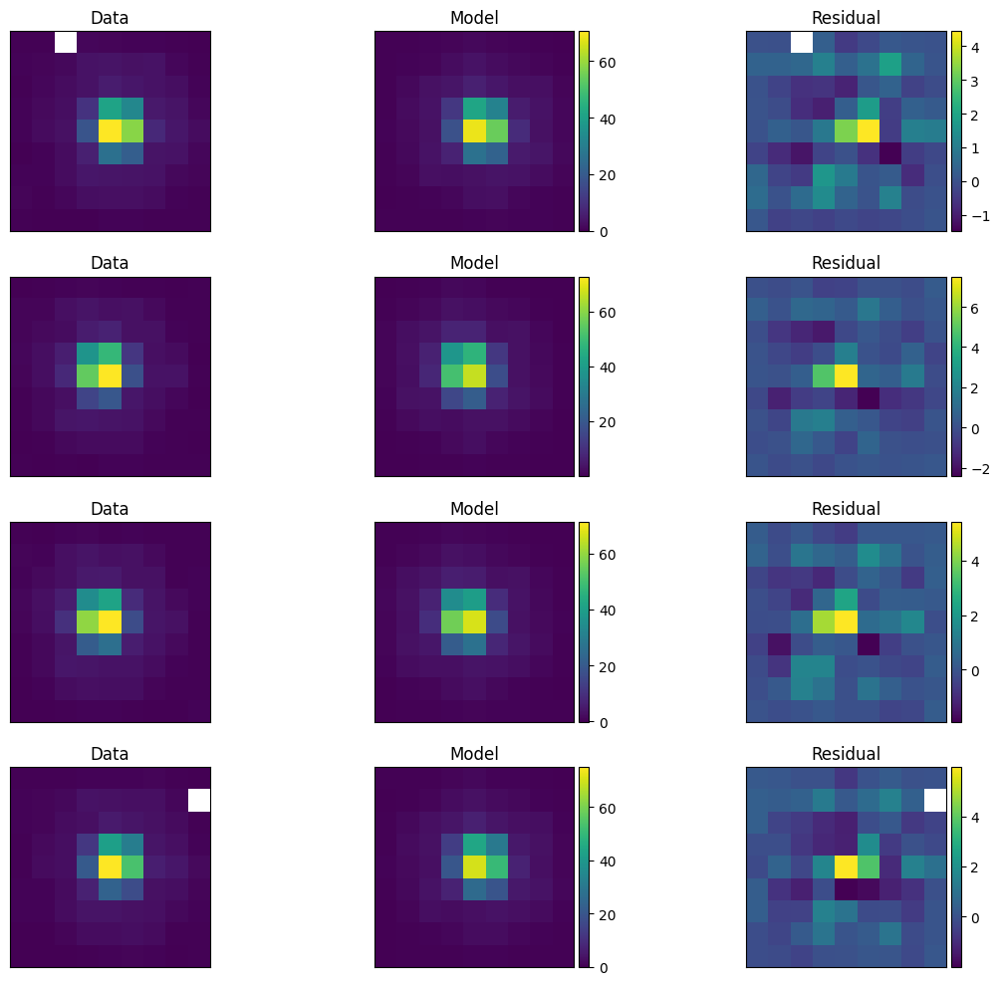

Elapsed Time for Photometry: 8.581961167044938
Starting 3.0  of 4 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74187347, -69.44817923)>


2023-12-15 17:19:19,588 - stpipe - WARNING - /Users/ofox/miniconda3/envs/space_phot4/lib/python3.10/site-packages/nestle.py:388: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  cov = make_eigvals_positive(cov, targetprod)



Finished PSF psf_photometry with median residuals of 59.75%


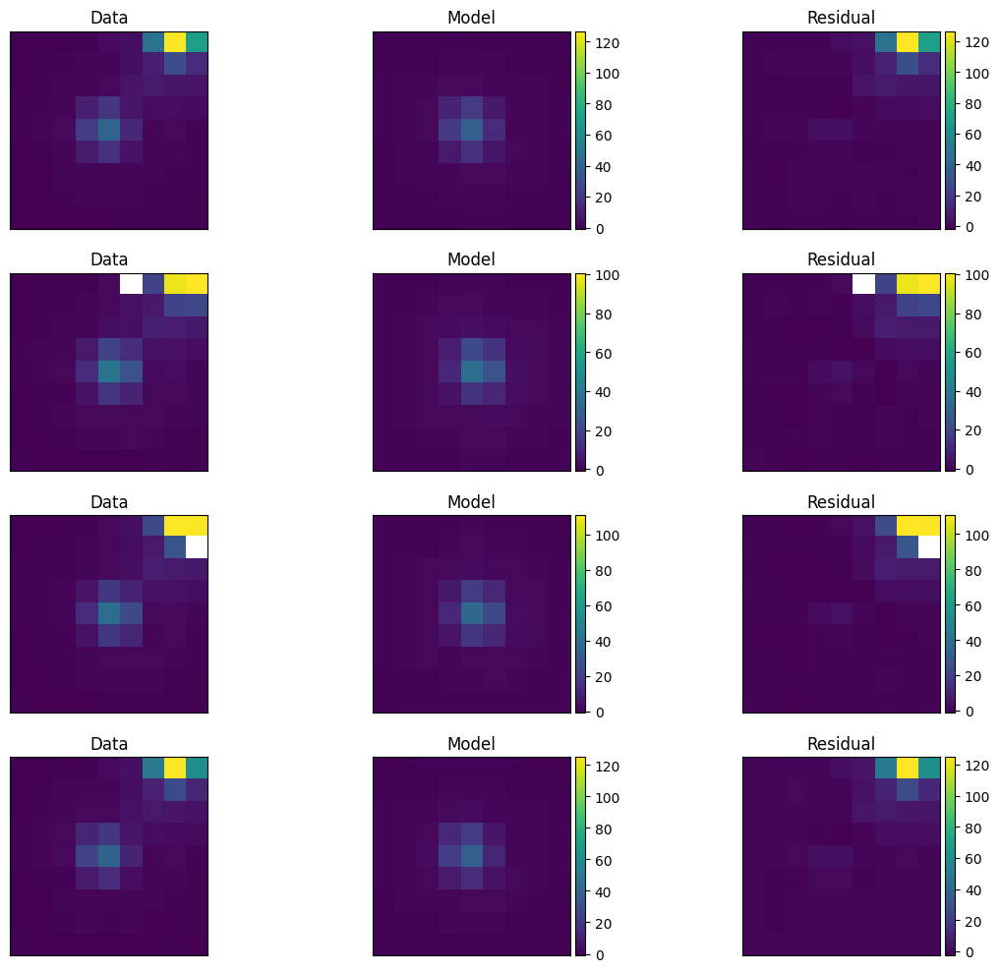

Elapsed Time for Photometry: 12.569976874976419
Starting 4.0  of 4 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74189746, -69.44834474)>
Finished PSF psf_photometry with median residuals of 17.70%


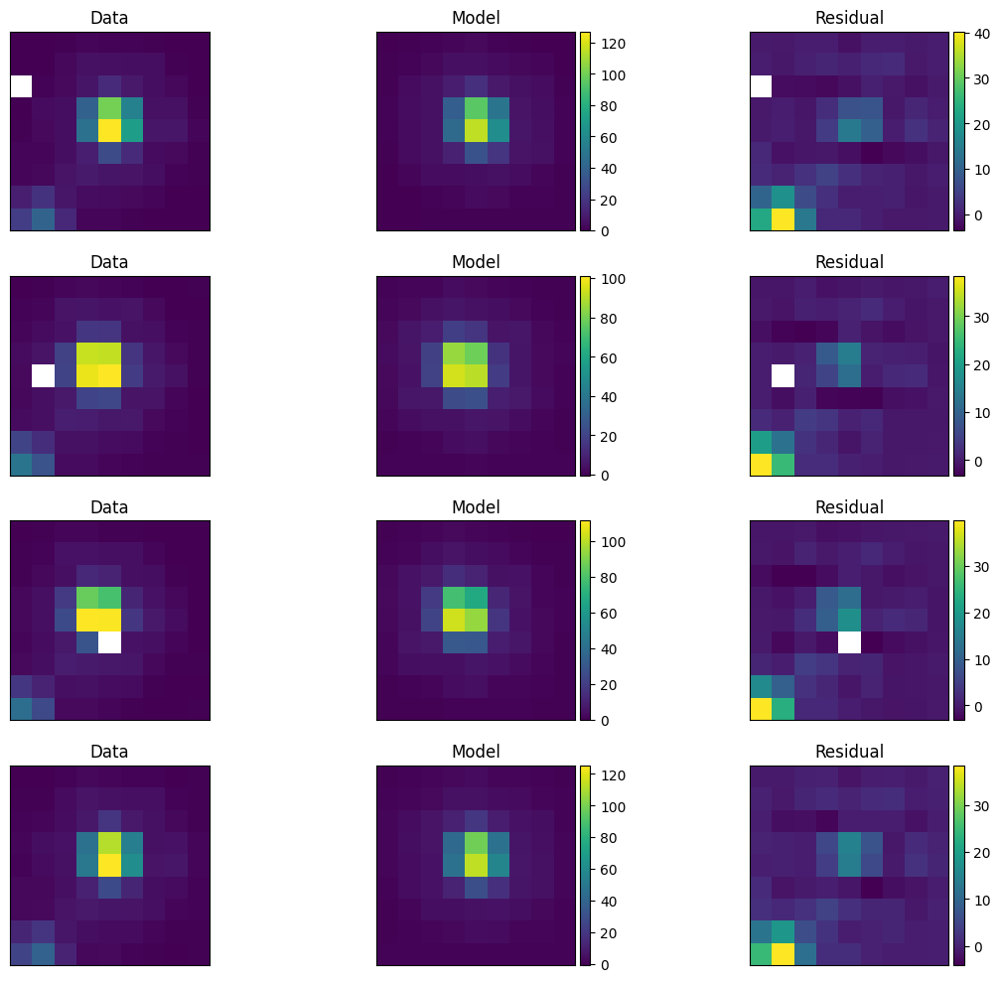

Elapsed Time for Photometry: 9.669096249970607


In [60]:
# Now Loop Through All Stars and Build Photometry Table
# Readers should refer to all diagnostics discussed above. 
# It should be noted that empty plots correspond to LVL2 files with dither positions that do not cover that particular coordinate.

import pandas as pd
counter = 0.
badindex = []

jwst_obs = space_phot.observation2(lvl2)
for source_location in skycoords:
    #print(source_location)
    tic = time.perf_counter()
    print('Starting',counter+1., ' of', len(skycoords), ':',  source_location)
    #psfs = space_phot.get_jwst_psf(jwst_obs,source_location)#,num_psfs=4)
    psfs = space_phot.util.get_jwst_psf_from_grid(jwst_obs,source_location,grid)
    jwst_obs.psf_photometry(psfs,source_location,bounds={'flux':[-100000,100000],
                        'centroid':[-2.,2.],
                        'bkg':[0,50]},
                        fit_width=9,
                        fit_bkg=True,
                        fit_flux='single',
                        maxiter=10000)
    
    jwst_obs.plot_psf_fit()
    plt.show()
#
#    jwst_obs.plot_psf_posterior(minweight=.0005)
#    plt.show()
    
    ra = jwst_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst_obs.psf_result.phot_cal_table['dec'][0]
    mag_arr = jwst_obs.psf_result.phot_cal_table['mag']
    magerr_arr = jwst_obs.psf_result.phot_cal_table['magerr']
    mag_lvl2psf = np.mean(mag_arr)
    magerr_lvl2psf = math.sqrt(sum(p**2 for p in magerr_arr))

    #print('Finished',counter, ' of', len(skycoords), ':',  source_location)
    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]), columns=['ra','dec','mag','magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]))], ignore_index=True)
    counter = counter + 1.
    
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [61]:
df

,ra,dec,mag,magerr,0,1,2,3
0,80.72802,-69.451343,17.965298,0.003512,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,80.737478,-69.448910,18.553230,0.004466
2,NaN,NaN,NaN,NaN,80.741881,-69.448180,19.303616,0.005538
3,NaN,NaN,NaN,NaN,80.741885,-69.448348,17.996253,0.003662


### 5.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="lmc3"></a> ###

In [ ]:
lvl2[0]

In [ ]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]

#ref_fits = fits.open(ref_image)
#ref_data = fits.open(ref_image)['SCI',1].data

ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data
norm1 = simple_norm(ref_data,stretch='linear',min_cut=0.5,max_cut=5)

plt.figure(figsize=(20,12))
plt.imshow(ref_data,origin='lower',norm=norm1,cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both',color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

#plt.imshow(ref_data, origin='lower',norm=norm1,cmap='gray')
#plt.gca().tick_params(labelcolor='none',axis='both',color='none')
#plt.show()

#### Dev Note: Need Grid Capability for Level3 Data for fater PSF Generation

In [ ]:
# Get PSF from WebbPSF and drizzle it to the source location
jwst3_obs = space_phot.observation3(lvl3[0])
#psf3 = space_phot.get_jwst3_psf(jwst_obs,source_location,num_psfs=4)
#grid = space_phot.util.get_jwst_psf_grid(jwst_obs,num_psfs=4)

In [ ]:
lvl3[0]

In [ ]:
skycoords

#### Readers should refer to all diagnostics discussed above. In general, this loop shows the difficulty in doing PSF photometry on a wide variety of stars (brightness, distribution on the detector, etc) without visual inspection. Especially when dealing with low SNR sources.This is true for all photometry packages. Users should inspect the associated metrics and consider optimizing the parameters for specific stars of interest. Nonetheless, the success of the fits can always be quantified in with the associated error bars.


In [ ]:
# Now Loop Through All Stars and Build Photometry Table

import pandas as pd
counter = 0.
badindex = []

for source_location in skycoords:
    #print(source_location)
    tic = time.perf_counter()
    print('Starting',counter+1., ' of', len(skycoords), ':',  source_location)
    #psf3 = space_phot.util.get_jwst_psf_from_grid(jwst3_obs,source_location,grid)
    psf3 = space_phot.get_jwst3_psf(jwst_obs,jwst3_obs,source_location,num_psfs=4)
    jwst3_obs.psf_photometry(psf3,source_location,bounds={'flux':[-10000,10000],
                        'centroid':[-2,2],
                        'bkg':[0,50]},
                        fit_width=9,
                        fit_bkg=True,
                        fit_flux=True)

    jwst3_obs.plot_psf_fit()
    plt.show()

    ra = jwst3_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst3_obs.psf_result.phot_cal_table['dec'][0]
    mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
    magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]

    #print('Finished',counter, ' of', len(skycoords), ':',  source_location)
    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]), columns=['ra','dec','mag','magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]))], ignore_index=True)
    counter = counter + 1.
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [ ]:
lvl2

<hr style="border:1px solid gray"> </hr>

<img style="float: center;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>